In [3]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import pydicom
import pydicom as dcm
import pydicom as dicom
from os import listdir, mkdir
import os
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
import os, glob, pydicom, imageio
from skimage import measure 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.figure_factory as ff
from plotly.graph_objs import *
init_notebook_mode(connected=True) 
from PIL import Image
from tqdm import tqdm

In [32]:
#pip install gdcm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 21.3 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
import time
start_time = time.time()
PATH = "/kaggle/input/rsna-str-pulmonary-embolism-detection/"
train_df = pd.read_csv(PATH + "train.csv")
#test_df = pd.read_csv(PATH + "test.csv")
TRAIN_PATH = PATH + "train/"
TEST_PATH = PATH + "test/"

train_image_file_paths = glob.glob(TRAIN_PATH + '/*/*/*.dcm')
test_image_file_paths = glob.glob(TEST_PATH + '/*/*/*.dcm')
print(f'Train dataframe shape  :{train_df.shape}')
print(f'Number of train images : {len(train_image_file_paths)}')
print(f'Number of test images  : {len(test_image_file_paths)}')

end_time = time.time()
execution_time = end_time - start_time
print(f'Execution time to load data: {execution_time:.2f} seconds')

Train dataframe shape  :(1790594, 17)
Number of train images : 1790594
Number of test images  : 146853
Execution time to load data: 457.06 seconds


In [4]:
test_df = pd.read_csv(PATH + "test.csv")

In [5]:
TRAIN_CSV = os.path.join(PATH, "train.csv")
train_df = pd.read_csv(TRAIN_CSV)
print("\n\n Train DataFrame \n\n")
display(train_df.head(5))



 Train DataFrame 




,StudyInstanceUID,SeriesInstanceUID,SOPInstanceUID,pe_present_on_image,negative_exam_for_pe,qa_motion,qa_contrast,flow_artifact,rv_lv_ratio_gte_1,rv_lv_ratio_lt_1,leftsided_pe,chronic_pe,true_filling_defect_not_pe,rightsided_pe,acute_and_chronic_pe,central_pe,indeterminate
0,6897fa9de148,2bfbb7fd2e8b,c0f3cb036d06,0,0,0,0,0,0,1,1,0,0,1,0,0,0
1,6897fa9de148,2bfbb7fd2e8b,f57ffd3883b6,0,0,0,0,0,0,1,1,0,0,1,0,0,0
2,6897fa9de148,2bfbb7fd2e8b,41220fda34a3,0,0,0,0,0,0,1,1,0,0,1,0,0,0
3,6897fa9de148,2bfbb7fd2e8b,13b685b4b14f,0,0,0,0,0,0,1,1,0,0,1,0,0,0
4,6897fa9de148,2bfbb7fd2e8b,be0b7524ffb4,0,0,0,0,0,0,1,1,0,0,1,0,0,0


In [6]:
print("Number of unique values in StudyInstanceUID:", train_df['StudyInstanceUID'].nunique())
print("Number of unique values in SeriesInstanceUID:", train_df['SeriesInstanceUID'].nunique())
print("Number of unique values in SOPInstanceUID:", train_df['SOPInstanceUID'].nunique())

Number of unique values in StudyInstanceUID: 7279
Number of unique values in SeriesInstanceUID: 7279
Number of unique values in SOPInstanceUID: 1790594


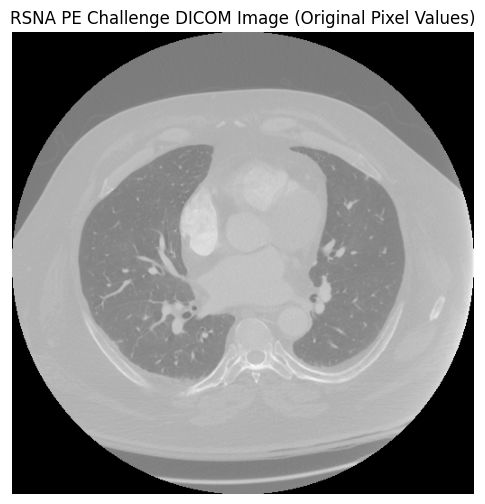

In [32]:
dicom_path = "/kaggle/input/rsna-str-pulmonary-embolism-detection/train/0003b3d648eb/d2b2960c2bbf/4284b2b2a495.dcm"
dicom_data = pydicom.dcmread(dicom_path)
image = dicom_data.pixel_array
plt.figure(figsize=(6, 6))
plt.imshow(image, cmap='gray')
plt.title("RSNA PE Challenge DICOM Image (Original Pixel Values)")
plt.axis('off')
plt.show()

Let's see the difference between no present PE and PE present

In [7]:
base = "../input/rsna-str-pulmonary-embolism-detection/train"
pe_yes = train_df[train_df["pe_present_on_image"] == 1].sample(random_state=33).reset_index()
pe_no = train_df[train_df["pe_present_on_image"] == 0].sample(random_state=101).reset_index()
pe_yes_path = base + "/" + pe_yes["StudyInstanceUID"] + "/" + pe_yes["SeriesInstanceUID"] + "/" + pe_yes["SOPInstanceUID"] + ".dcm"
pe_no_path = base + "/" + pe_no["StudyInstanceUID"] + "/" + pe_no["SeriesInstanceUID"] + "/" + pe_no["SOPInstanceUID"] + ".dcm"
pe_yes_path = pe_yes_path[0]
pe_no_path = pe_no_path[0]

In [8]:
pe_yes[["SOPInstanceUID", "pe_present_on_image", "leftsided_pe", "rightsided_pe", "central_pe"]]

,SOPInstanceUID,pe_present_on_image,leftsided_pe,rightsided_pe,central_pe
0,df82d4ba7cf2,1,1,1,1


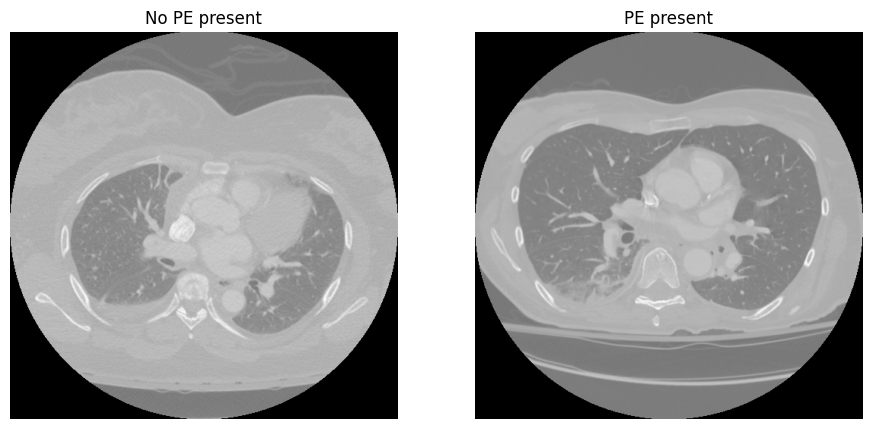

In [ ]:
dataset_yes = pydicom.dcmread(pe_yes_path)
dataset_no = pydicom.dcmread(pe_no_path)
f, ax = plt.subplots(1, 2, figsize = (11, 11))
ax[0].imshow(dataset_no.pixel_array, cmap="gray")
ax[1].imshow(dataset_yes.pixel_array, cmap="gray")
ax[0].title.set_text("No PE present")
ax[1].title.set_text("PE present")
ax[0].axis('off')
ax[1].axis('off');

### Data fields 📊

NOTE: We can find this on the competition page but still I am presenting it here

- StudyInstanceUID - unique ID for each study (exam) in the data.
- SeriesInstanceUID - unique ID for each series within the study.
- SOPInstanceUID - unique ID for each image within the study (and data).
- pe_present_on_image - image-level, notes whether any form of PE is present on the image.
- negative_exam_for_pe - exam-level, whether there are any images in the study that have PE present.
- qa_motion - informational, indicates whether radiologists noted an issue with motion in the study.
- qa_contrast - informational, indicates whether radiologists noted an issue with contrast in the study.
- flow_artifact - informational
- rv_lv_ratio_gte_1 - exam-level, indicates whether the RV/LV ratio present in the study is >= 1
- rv_lv_ratio_lt_1 - exam-level, indicates whether the RV/LV ratio present in the study is < 1
- leftsided_pe - exam-level, indicates that there is PE present on the left side of the images in the study
- chronic_pe - exam-level, indicates that the PE in the study is chronic
- true_filling_defect_not_pe - informational, indicates a defect that is NOT PE
- rightsided_pe - exam-level, indicates that there is PE present on the right side of the images in the study
- acute_and_chronic_pe - exam-level, indicates that the PE present in the study is both acute AND chronic
- central_pe - exam-level, indicates that there is PE present in the center of the images in the study
- indeterminate -exam-level, indicates that while the study is not negative for PE, an ultimate set of exam-level labels could not be created, due to QA issues

In [7]:
missing_values = train_df.isnull().sum()
print("Missing Values in Each Column:\n", missing_values)

Missing Values in Each Column:
 StudyInstanceUID              0
SeriesInstanceUID             0
SOPInstanceUID                0
pe_present_on_image           0
negative_exam_for_pe          0
qa_motion                     0
qa_contrast                   0
flow_artifact                 0
rv_lv_ratio_gte_1             0
rv_lv_ratio_lt_1              0
leftsided_pe                  0
chronic_pe                    0
true_filling_defect_not_pe    0
rightsided_pe                 0
acute_and_chronic_pe          0
central_pe                    0
indeterminate                 0
dtype: int64


In [8]:
data_summary = train_df.ecribe()
print("\nData Summary:\n", data_summary)


Data Summary:
        pe_present_on_image  negative_exam_for_pe     qa_motion   qa_contrast  \
count         1.790594e+06          1.790594e+06  1.790594e+06  1.790594e+06   
mean          5.391507e-02          6.763929e-01  8.250893e-03  1.579699e-02   
std           2.258501e-01          4.678522e-01  9.045894e-02  1.246894e-01   
min           0.000000e+00          0.000000e+00  0.000000e+00  0.000000e+00   
25%           0.000000e+00          0.000000e+00  0.000000e+00  0.000000e+00   
50%           0.000000e+00          1.000000e+00  0.000000e+00  0.000000e+00   
75%           0.000000e+00          1.000000e+00  0.000000e+00  0.000000e+00   
max           1.000000e+00          1.000000e+00  1.000000e+00  1.000000e+00   

       flow_artifact  rv_lv_ratio_gte_1  rv_lv_ratio_lt_1  leftsided_pe  \
count   1.790594e+06       1.790594e+06      1.790594e+06  1.790594e+06   
mean    4.015874e-02       1.287500e-01      1.743723e-01  2.108987e-01   
std     1.963314e-01       3.349231e-0

In [7]:
train_df.dtypes

StudyInstanceUID              object
SeriesInstanceUID             object
SOPInstanceUID                object
pe_present_on_image            int64
negative_exam_for_pe           int64
qa_motion                      int64
qa_contrast                    int64
flow_artifact                  int64
rv_lv_ratio_gte_1              int64
rv_lv_ratio_lt_1               int64
leftsided_pe                   int64
chronic_pe                     int64
true_filling_defect_not_pe     int64
rightsided_pe                  int64
acute_and_chronic_pe           int64
central_pe                     int64
indeterminate                  int64
dtype: object

In [9]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1790594 entries, 0 to 1790593
Data columns (total 17 columns):
 #   Column                      Dtype 
---  ------                      ----- 
 0   StudyInstanceUID            object
 1   SeriesInstanceUID           object
 2   SOPInstanceUID              object
 3   pe_present_on_image         int64 
 4   negative_exam_for_pe        int64 
 5   qa_motion                   int64 
 6   qa_contrast                 int64 
 7   flow_artifact               int64 
 8   rv_lv_ratio_gte_1           int64 
 9   rv_lv_ratio_lt_1            int64 
 10  leftsided_pe                int64 
 11  chronic_pe                  int64 
 12  true_filling_defect_not_pe  int64 
 13  rightsided_pe               int64 
 14  acute_and_chronic_pe        int64 
 15  central_pe                  int64 
 16  indeterminate               int64 
dtypes: int64(14), object(3)
memory usage: 232.2+ MB


📌 We are dealing with approximately 240 MB of tabular data

In [10]:
print("Number of unique Study instances are", train_df['StudyInstanceUID'].nunique())
print("Number of unique Series instances are", train_df['SeriesInstanceUID'].nunique())

Number of unique Study instances are 7279
Number of unique Series instances are 7279


📌 As both Study and Series are the same number we can infer that there is only one series for each study.

### Missing values ⁇

Now we will see if there are any null values or not

In [16]:
print('Null values in train data:',train_df.isnull().sum().sum())
print('Null values in test data:',test_df.isnull().sum().sum())

Null values in train data: 0
Null values in test data: 0


📌 No missing values and clean data

### Working with CT scans 🩻

In [10]:
def load_scans(dcm_path):
    files = listdir(dcm_path)
    f = [pydicom.dcmread(dcm_path + "/" + str(file)) for file in files]
    return f

In [11]:
basepath = "../input/rsna-str-pulmonary-embolism-detection/"
listdir(basepath)

['sample_submission.csv', 'train.csv', 'test.csv', 'test', 'train']

In [12]:
example = basepath + "train/" + train_df.StudyInstanceUID.values[0] +'/'+ train_df.SeriesInstanceUID.values[0]
file_names = listdir(example)

In [13]:
scans = load_scans(example)
scans[0]

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 172
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.826.0.1.3680043.10.474.405991.10089
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.40.0.13.1.1.1
(0002, 0013) Implementation Version Name         SH: 'dcm4che-1.4.38'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL', 'CT_SOM5 SPI DUAL', 'STD', 'SNRG', 'DET_AB']
(0008, 0016) SOP Class UID                       UI: 80e30f500244
(0008, 0018) SOP Instance UID                    UI: 822dd7790999
(0008, 0060) Modality                            CS: 'CT'
(0018, 0

Few details about CT Scans:

- CT-scan captures information about the radiodensity of an object or tissue exposed to x-rays.A transversal slice of a scan is reconstructed after taking measurements from several different directions.

- We use something called as Hounsfield Units which is defined as Relative quantitative measurement of radio density used by radiologists in the interpretation of computed tomography (CT) images

- The CT-scans are already in the HU format
- CT-scanner yields roughly 4000 grey values that can't be captured by our eyes. So we perform something called as windowing.
- Water has HU 0 and Air -1000


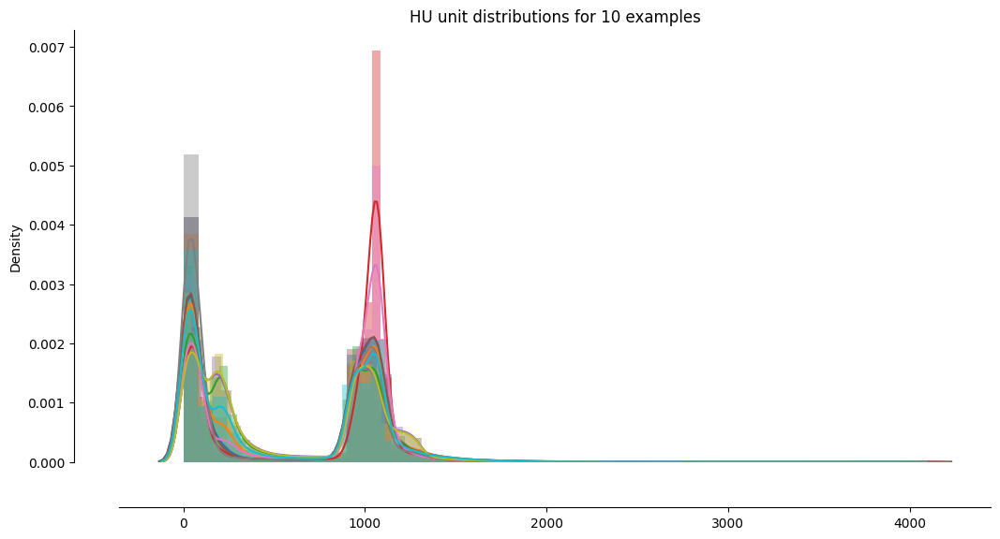

In [65]:
import matplotlib.pyplot as plt
plt.style.use('default')
plt.figure(figsize=(12,6))
for n in range(10):
    image = scans[n].pixel_array.flatten()
    rescaled_image = image * scans[n].RescaleSlope + scans[n].RescaleIntercept
    sns.distplot(image.flatten());
plt.title("HU unit distributions for 10 examples")
sns.despine(right=True, offset=35);

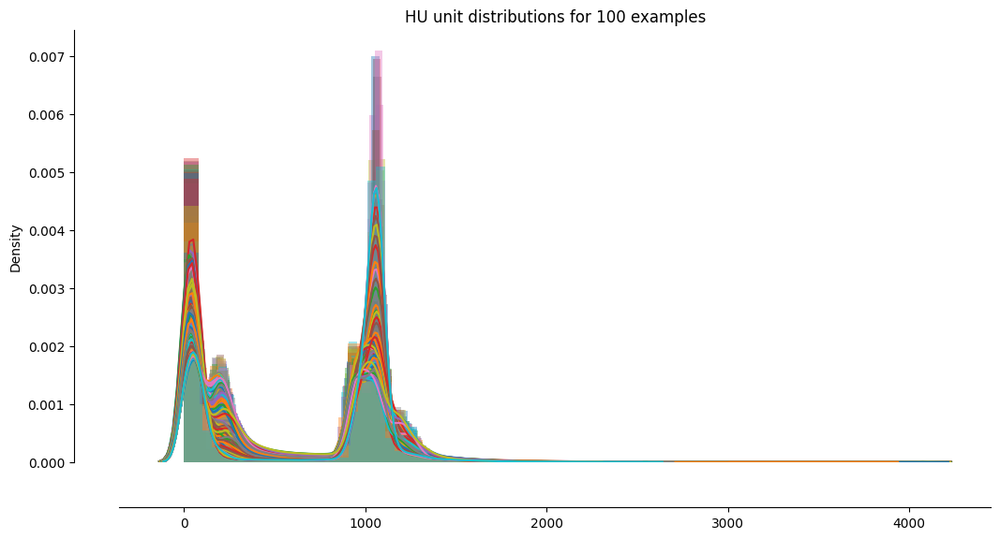

In [66]:
plt.figure(figsize=(12,6))
for n in range(100):
    image = scans[n].pixel_array.flatten()
    rescaled_image = image * scans[n].RescaleSlope + scans[n].RescaleIntercept
    sns.distplot(image.flatten());
plt.title("HU unit distributions for 100 examples")
sns.despine(right=True, offset=35);

📌 In the above graph we have plotted pixel distributions of 10 examples.

In [14]:
def load_slice(path):
    slices = [pydicom.read_file(path + '/' + s) for s in listdir(path)]
    slices.sort(key = lambda x: float(x.ImagePositionPatient[2]))
    try:
        slice_thickness = np.abs(slices[0].ImagePositionPatient[2] - slices[1].ImagePositionPatient[2])
    except:
        slice_thickness = np.abs(slices[0].SliceLocation - slices[1].SliceLocation)
    for s in slices:
        s.SliceThickness = slice_thickness
    return slices

def transform_to_hu(slices):
    images = np.stack([file.pixel_array for file in slices])
    images = images.astype(np.int16)
    # convert ouside pixel-values to air:
    # I'm using <= -1000 to be sure that other defaults are captured as well
    images[images <= -1000] = 0
    # convert to HU
    for n in range(len(slices)):
        intercept = slices[n].RescaleIntercept
        slope = slices[n].RescaleSlope
        if slope != 1:
            images[n] = slope * images[n].astype(np.float64)
            images[n] = images[n].astype(np.int16) 
        images[n] += np.int16(intercept)
    return np.array(images, dtype=np.int16)

def resample(image, scan, new_spacing=[1,1,1]):
    spacing = np.array([float(scans_0[0].SliceThickness), 
                        float(scans_0[0].PixelSpacing[0]), 
                        float(scans_0[0].PixelSpacing[0])])
    resize_factor = spacing / new_spacing
    new_real_shape = image.shape * resize_factor
    new_shape = np.round(new_real_shape)
    real_resize_factor = new_shape / image.shape
    new_spacing = spacing / real_resize_factor
    image = scipy.ndimage.interpolation.zoom(image, real_resize_factor)
    return image, new_spacing

def make_mesh(image, threshold=-300, step_size=1):
    p = image.transpose(2,1,0)
    verts, faces, norm, val = measure.marching_cubes_lewiner(p, threshold, step_size=step_size, allow_degenerate=True)
    return verts, faces

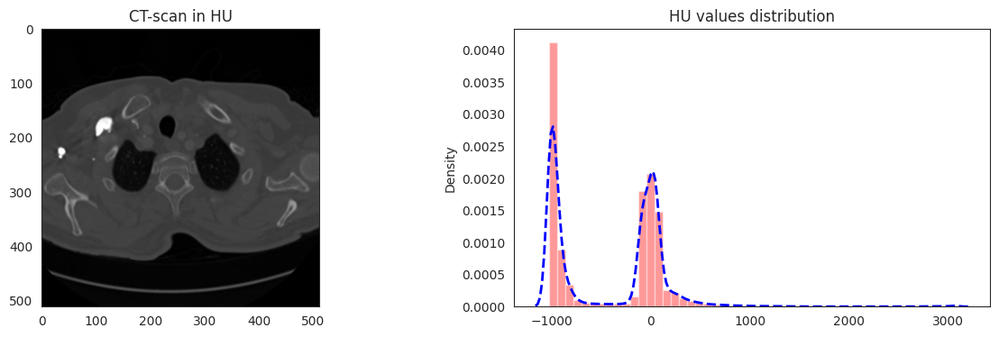

In [39]:
sns.set_style('white')

hu_scans = transform_to_hu(scans)

fig, ax = plt.subplots(1,2,figsize=(15,4))
ax[0].set_title("CT-scan in HU")
ax[0].imshow(hu_scans[0], cmap="gray")
ax[1].set_title("HU values distribution");
sns.distplot(hu_scans[0].flatten(), ax=ax[1],color='red', kde_kws=dict(lw=2, ls="--",color='blue'));
ax[1].grid(False)

In [ ]:
sns.set_style('white')
hu_scans = transform_to_hu(scans)
fig, ax = plt.subplots(1,2,figsize=(15,4))
ax[0].set_title("CT-scan in HU")
ax[0].imshow(hu_scans[0], cmap="gray")
ax[1].set_title("HU values distribution");
sns.distplot(hu_scans[0].flatten(), ax=ax[1],color='red', kde_kws=dict(lw=2, ls="--",color='blue'))
sns.despine(right=True, offset=35);
ax[1].grid(False)

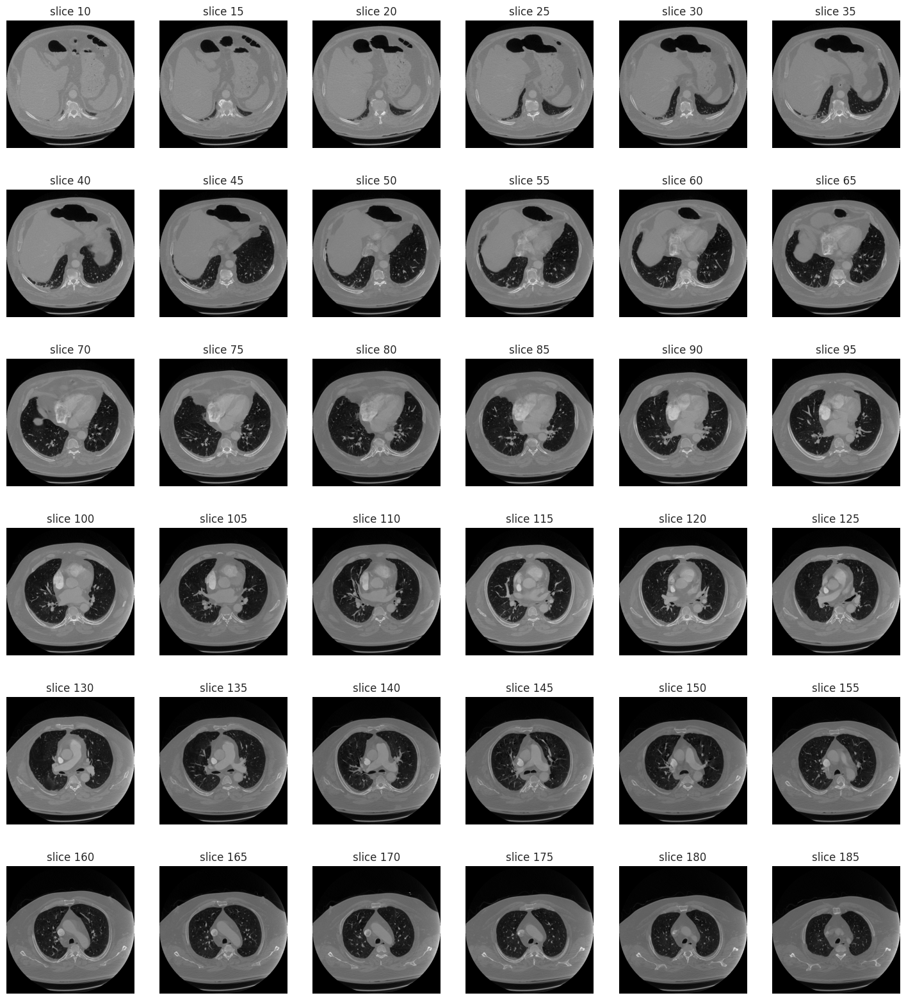

In [50]:
def sample_stack_gray(stack, rows=6, cols=6, start_with=10, show_every=5):
    fig,ax = plt.subplots(rows,cols,figsize=[18,20])
    for i in range(rows*cols):
        ind = start_with + i*show_every
        ax[int(i/rows),int(i % rows)].set_title(f'slice {ind}')
        ax[int(i/rows),int(i % rows)].imshow(stack[ind],cmap='gray')
        ax[int(i/rows),int(i % rows)].axis('off')
    plt.show()

sample_stack_gray(first_patient_pixels)

### DICOM INFO


In [59]:
im_path = []
train_path = '../input/rsna-str-pulmonary-embolism-detection/train/'
for i in listdir(train_path): 
    for j in listdir(train_path + i):
        x = i+'/'+j
        im_path.append(x)

In [60]:
def get_window_value(feature):
    if isinstance(feature, pydicom.multival.MultiValue):
        return int(feature[0])
    else:
        return int(feature)

pixelspacing_r = []
pixelspacing_c = []
slice_thicknesses = []
ids = []
id_pth = []
row_values = []
column_values = []
window_widths = []
window_levels = []
modality = []
kvp = []
table_height = []
x_ray_tube = []
exp = []
pos = []
tilt = []
bits = []
rescale_inter = []
rescale_slope = []
photometric_interpretation = []
convolution_kernel = [] 

for i in im_path:
    ids.append(i.split('/')[0]+'_'+i.split('/')[1])
    example_dcm = listdir(train_path  + i + "/")[0]
    id_pth.append(train_path + i)
    dataset = pydicom.dcmread(train_path + i + "/" + example_dcm)
    
    window_widths.append(get_window_value(dataset.WindowWidth))
    window_levels.append(get_window_value(dataset.WindowCenter))
    
    spacing = dataset.PixelSpacing
    slice_thicknesses.append(dataset.SliceThickness)
    
    row_values.append(dataset.Rows)
    column_values.append(dataset.Columns)
    pixelspacing_r.append(spacing[0])
    pixelspacing_c.append(spacing[1])
    
    modality.append(dataset.Modality)
    kvp.append(dataset.KVP)
    table_height.append(dataset.TableHeight)
    x_ray_tube.append(dataset.XRayTubeCurrent)
    exp.append(dataset.Exposure)
    pos.append(dataset.PatientPosition)
    tilt.append(dataset.GantryDetectorTilt)
    bits.append(dataset.BitsAllocated)
    rescale_inter.append(dataset.RescaleIntercept)
    rescale_slope.append(dataset.RescaleSlope)
    photometric_interpretation.append(dataset.PhotometricInterpretation)
    convolution_kernel.append(dataset.ConvolutionKernel)
    
scan_properties = pd.DataFrame(data=ids, columns=["ID"])
scan_properties.loc[:, "rows"] = row_values
scan_properties.loc[:, "columns"] = column_values
scan_properties.loc[:, "area"] = scan_properties["rows"] * scan_properties["columns"]
scan_properties.loc[:, "pixelspacing_r"] = pixelspacing_r
scan_properties.loc[:, "pixelspacing_c"] = pixelspacing_c
scan_properties.loc[:, "pixelspacing_area"] = scan_properties.pixelspacing_r * scan_properties.pixelspacing_c
scan_properties.loc[:, "slice_thickness"] = slice_thicknesses
scan_properties.loc[:, "id_pth"] = id_pth
scan_properties.loc[:, "window_width"] = window_widths
scan_properties.loc[:, "window_level"] = window_levels
scan_properties.loc[:, "modality"] = modality
scan_properties.loc[:, "kvp"] = kvp
scan_properties.loc[:, "table_height"] = table_height
scan_properties.loc[:, "x_ray_tube_current"] = x_ray_tube
scan_properties.loc[:, "exposure"] = exp 
scan_properties.loc[:,"patient_position"] = pos
scan_properties.loc[:,"detector_tilt"] = tilt
scan_properties.loc[:,"bits_allocated"] = bits
scan_properties.loc[:,"rescale_intercept"] = rescale_inter
scan_properties.loc[:, "rescale_slope"] = rescale_slope
scan_properties.loc[:, "photometric_interpretation"] = photometric_interpretation
scan_properties.loc[:, "convolution_kernel"] = convolution_kernel

scan_properties.head().T

,0,1,2,3,4
ID,da805a06b41d_2d1f114ff9d3,ca9267e91f97_ca07cea67008,96f2034f6784_3ccdba99a05d,fc97b3c6a5c4_995db8bd358d,4a68cb8ce5f2_740211bf61cf
rows,512,512,512,512,512
columns,512,512,512,512,512
area,262144,262144,262144,262144,262144
pixelspacing_r,0.707031,0.712891,0.59375,0.644531,0.658203
pixelspacing_c,0.707031,0.712891,0.59375,0.644531,0.658203
pixelspacing_area,0.499893,0.508214,0.352539,0.41542,0.433231
slice_thickness,1.25,1.25,1.25,1.25,1.25
id_pth,../input/rsna-str-pulmonary-embolism-detection...,../input/rsna-str-pulmonary-embolism-detection...,../input/rsna-str-pulmonary-embolism-detection...,../input/rsna-str-pulmonary-embolism-detection...,../input/rsna-str-pulmonary-embolism-detection...
window_width,350,350,400,350,400


Image Resolution

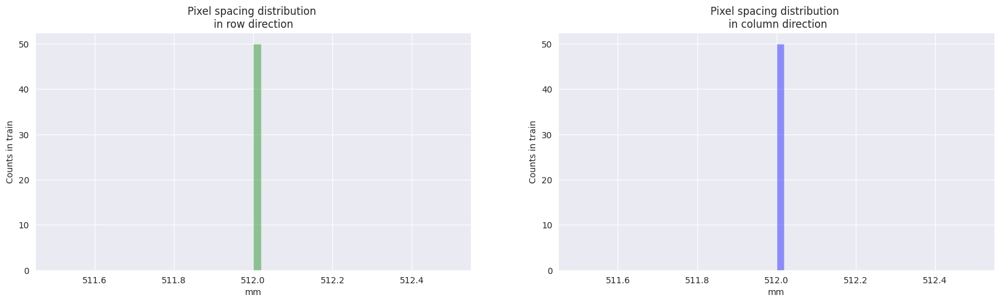

In [61]:
sns.set_style('darkgrid')
fig, ax = plt.subplots(1,2,figsize=(20,5))
sns.distplot(row_values, ax=ax[0], color='green', kde_kws=dict(lw=3, ls="--",color='red'))
ax[0].set_title("Pixel spacing distribution \n in row direction ")
ax[0].set_ylabel("Counts in train")
ax[0].set_xlabel("mm")
sns.distplot(column_values, ax=ax[1], color="Blue",kde_kws=dict(lw=3, ls="--",color='red'))
ax[1].set_title("Pixel spacing distribution \n in column direction");
ax[1].set_ylabel("Counts in train");
ax[1].set_xlabel("mm");

Pixelspacing

The pixelspacing attribute we can find in the dicom files is an important one. 

It tells us how much physical distance is covered by one pixel. You can see that there are only 2 values that describe the x- and y-direction in the plane of a transversal slice.


For one patient this pixelspacing is usually the same for all slices.


But between patients the pixelspacing can differ due to personal or institutional preferences of doctors and the clinic and it also depends on the scanner type. Consequently if we compare two images in the size of the lungs it does not automatically mean that the bigger one is really larger in the physical size of the organ!

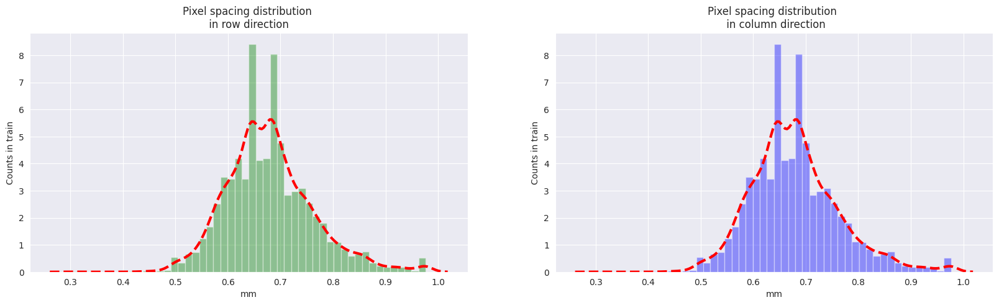

In [38]:
sns.set_style('darkgrid')
fig, ax = plt.subplots(1,2,figsize=(20,5))
sns.distplot(pixelspacing_r, ax=ax[0], color='green', kde_kws=dict(lw=3, ls="--",color='red'))
ax[0].set_title("Pixel spacing distribution \n in row direction ")
ax[0].set_ylabel("Counts in train")
ax[0].set_xlabel("mm")
sns.distplot(pixelspacing_c, ax=ax[1], color="Blue",kde_kws=dict(lw=3, ls="--",color='red'))
ax[1].set_title("Pixel spacing distribution \n in column direction");
ax[1].set_ylabel("Counts in train");
ax[1].set_xlabel("mm");

We can see that the values really vary a lot from patient to patient! As they are given in mm and ct-scans usually cover 512 row and column values

### Physical area & slice volume covered by a single CT-scan

Now, we know some important quantities to compute the physical distance covered by a ct-scan!

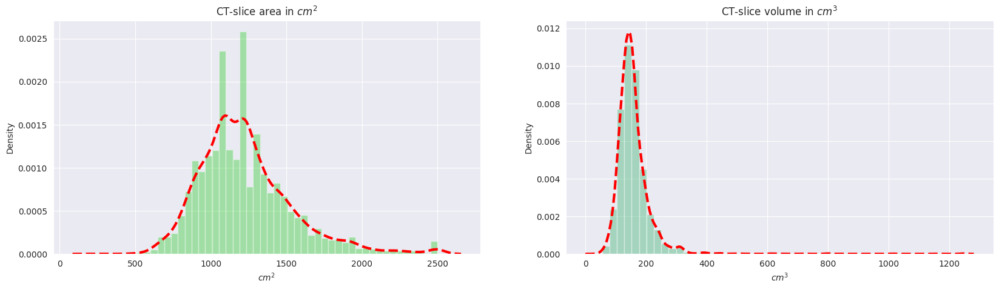

In [40]:
scan_properties["r_distance"] = scan_properties.pixelspacing_r * scan_properties.rows
scan_properties["c_distance"] = scan_properties.pixelspacing_c * scan_properties["columns"]
scan_properties["area_cm2"] = 0.1* scan_properties["r_distance"] * 0.1*scan_properties["c_distance"]
scan_properties["slice_volume_cm3"] = 0.1*scan_properties.slice_thickness * scan_properties.area_cm2

fig, ax = plt.subplots(1,2,figsize=(20,5))
sns.distplot(scan_properties.area_cm2, ax=ax[0], color="Limegreen",kde_kws=dict(lw=3, ls="--",color='red'))
sns.distplot(scan_properties.slice_volume_cm3, ax=ax[1], color="Mediumseagreen",kde_kws=dict(lw=3, ls="--",color='red'))
ax[0].set_title("CT-slice area in $cm^{2}$")
ax[1].set_title("CT-slice volume in $cm^{3}$")
ax[0].set_xlabel("$cm^{2}$")
ax[1].set_xlabel("$cm^{3}$");

In [43]:
scan_properties.dtypes

ID                             object
rows                            int64
columns                         int64
area                            int64
pixelspacing_r                float64
pixelspacing_c                float64
pixelspacing_area             float64
slice_thickness               float64
id_pth                         object
window_width                    int64
window_level                    int64
modality                       object
kvp                           float64
table_height                  float64
x_ray_tube_current              int64
exposure                        int64
patient_position               object
detector_tilt                 float64
bits_allocated                  int64
rescale_intercept             float64
rescale_slope                 float64
photometric_interpretation     object
convolution_kernel             object
r_distance                    float64
c_distance                    float64
area_cm2                      float64
slice_volume

In [44]:
scan_properties.to_csv('Pulmonary_Embolism_CT_scans_data.csv',index=False)

### Specific Images (label)

In [82]:
def read_dicom(file_path, show = False, cmap = 'gray'):
    im = dcm.dcmread(file_path)
    image = im.pixel_array
    if show:
        plt.imshow(image, cmap = 'gray')
    return image

def show_images_with_specific_condition(column_name):
    
    rows = 1
    cols = 3
    
    train_with_condition = train_df[train_df[column_name] == 0]
    train_with_condition = train_with_condition.sample(n = rows*cols) 
    train_image_file_paths = []
    for _, entry in train_with_condition.iterrows():
        train_image_file_paths.append('../input/rsna-str-pulmonary-embolism-detection/train/'+str(entry['StudyInstanceUID'])+'/'+str(entry['SeriesInstanceUID'])+'/'+str(entry['SOPInstanceUID'])+'.dcm')
    counter  = 0
    fig = plt.figure(figsize=(25,15))
    fig.suptitle('Samples with ' + column_name + ' = 0', fontsize=20)
    for path in train_image_file_paths:
        fig.add_subplot(rows, cols, counter+1)
        plt.imshow(read_dicom(path), cmap='gray')
        plt.axis(False)
        fig.add_subplot
        counter += 1
    
    
    train_with_condition = train_df[train_df[column_name] == 1]
    train_with_condition = train_with_condition.sample(n = rows*cols) 
    train_image_file_paths = []
    for _, entry in train_with_condition.iterrows():
        train_image_file_paths.append('../input/rsna-str-pulmonary-embolism-detection/train/'+str(entry['StudyInstanceUID'])+'/'+str(entry['SeriesInstanceUID'])+'/'+str(entry['SOPInstanceUID'])+'.dcm')
    counter  = 0
    fig = plt.figure(figsize=(25,15))
    fig.suptitle('Samples with ' + column_name + ' = 1', fontsize=20)
    for path in train_image_file_paths:
        fig.add_subplot(rows, cols, counter+1)
        plt.imshow(read_dicom(path), cmap='gray')
        plt.axis(False)
        fig.add_subplot
        counter += 1

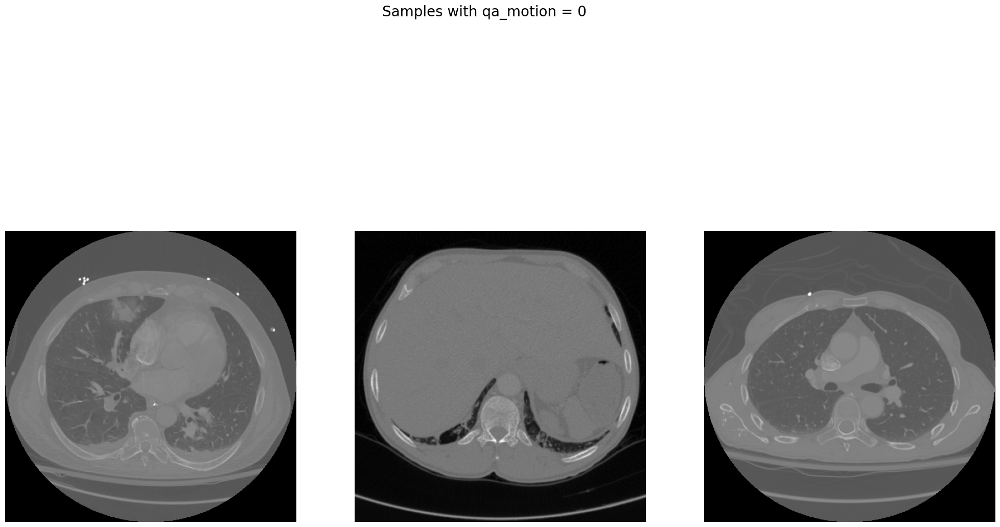

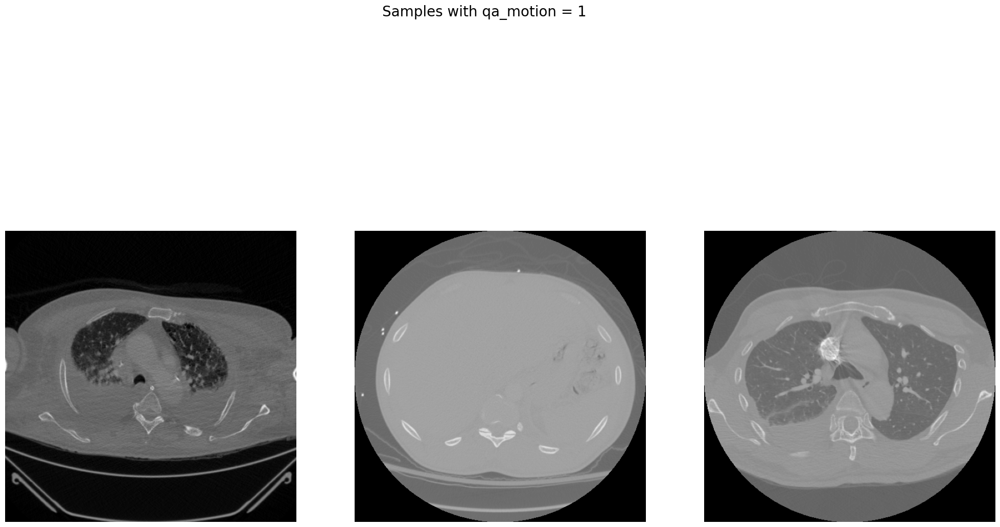

In [83]:
# Images with QA_Motion

show_images_with_specific_condition('qa_motion')


In [106]:
def read_dicom(file_path, show=False, cmap='gray'):
    im = dcm.dcmread(file_path)
    image = im.pixel_array
    if show:
        plt.imshow(image, cmap=cmap)
        plt.axis('off')
    return image

def show_images_with_specific_condition(column_name, n_samples=5):
    def plot_images(paths, title, rows, cols):
        fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
        fig.suptitle(title, fontsize=30)
        for ax, path in zip(axes.flatten(), paths):
            image = read_dicom(path)
            ax.imshow(image, cmap='gray')
            ax.axis('off')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.subplots_adjust(top=0.99)  # Ajusta espacio para el título
        plt.show()
    
    rows = 1
    cols = n_samples

    for condition_value in [0, 1]:
        filtered_df = train_df[train_df[column_name] == condition_value]
        sampled_df = filtered_df.sample(n=rows * cols)
        image_paths = [
            f"../input/rsna-str-pulmonary-embolism-detection/train/{row['StudyInstanceUID']}/{row['SeriesInstanceUID']}/{row['SOPInstanceUID']}.dcm"
            for _, row in sampled_df.iterrows()
        ]
        plot_images(image_paths, f'Samples with {column_name} = {condition_value}', rows, cols)

In [109]:
def read_dicom(file_path, show=False, cmap='gray'):
    im = dcm.dcmread(file_path)
    image = im.pixel_array
    if show:
        plt.imshow(image, cmap=cmap)
        plt.axis('off')
    return image

def show_images_with_specific_condition(column_name, n_samples=5):
    def plot_images(paths, title, rows, cols):
        fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
        fig.suptitle(title, fontsize=30)
        for ax, path in zip(axes.flatten(), paths):
            image = read_dicom(path)
            ax.imshow(image, cmap='gray')
            ax.axis('off')
        plt.subplots_adjust(top=0.90, wspace=0.05, hspace=0.05)  # Ajusta espacio para el título y entre imágenes
        plt.show()
    
    rows = 1
    cols = n_samples

    for condition_value in [0, 1]:
        filtered_df = train_df[train_df[column_name] == condition_value]
        sampled_df = filtered_df.sample(n=rows * cols)
        image_paths = [
            f"../input/rsna-str-pulmonary-embolism-detection/train/{row['StudyInstanceUID']}/{row['SeriesInstanceUID']}/{row['SOPInstanceUID']}.dcm"
            for _, row in sampled_df.iterrows()
        ]
        plot_images(image_paths, f'Samples with {column_name} = {condition_value}', rows, cols)

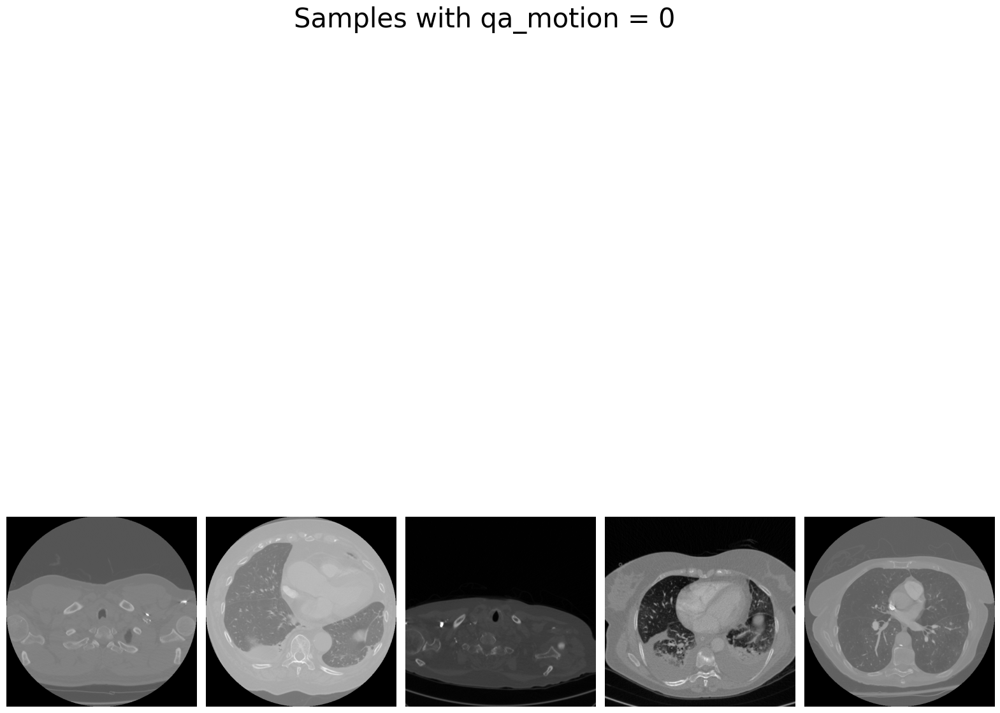

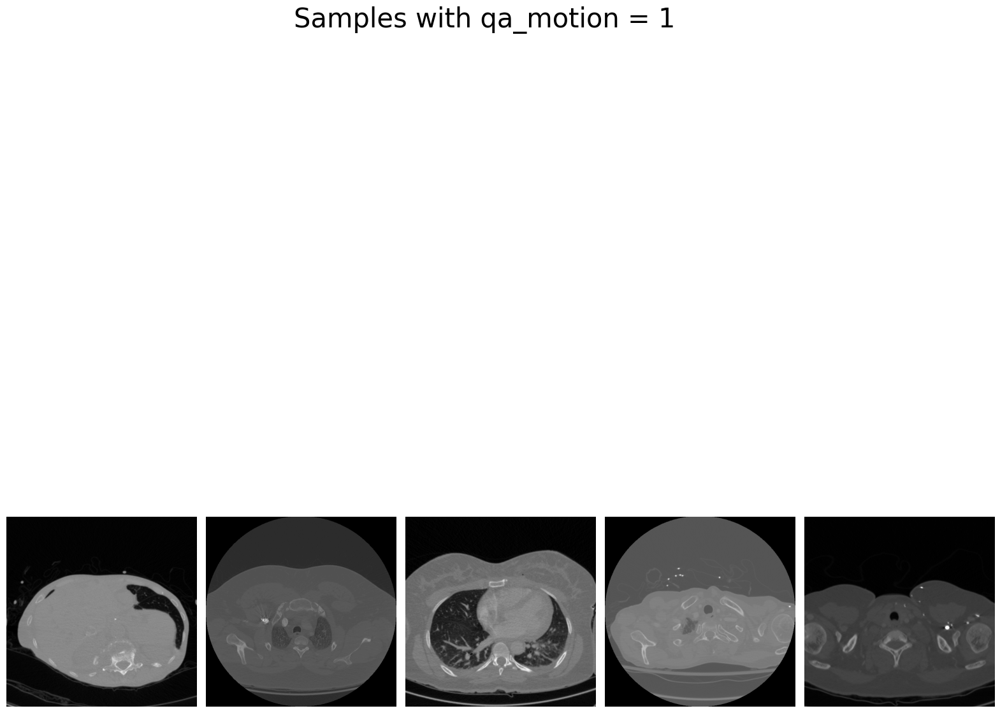

In [111]:
# Images with QA_Motion
show_images_with_specific_condition('qa_motion')

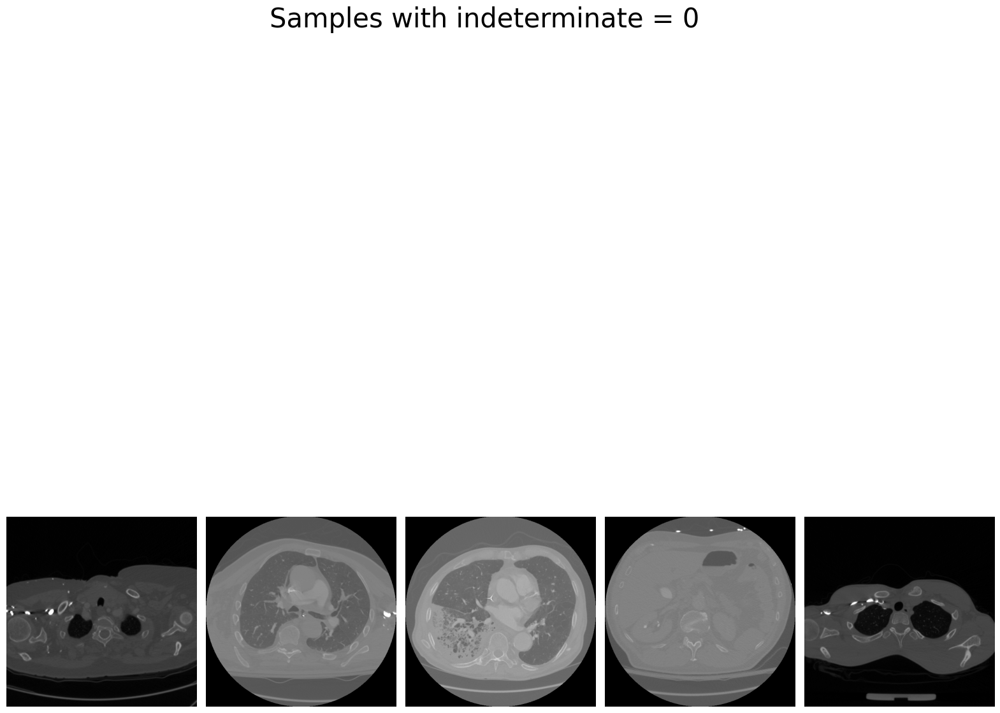

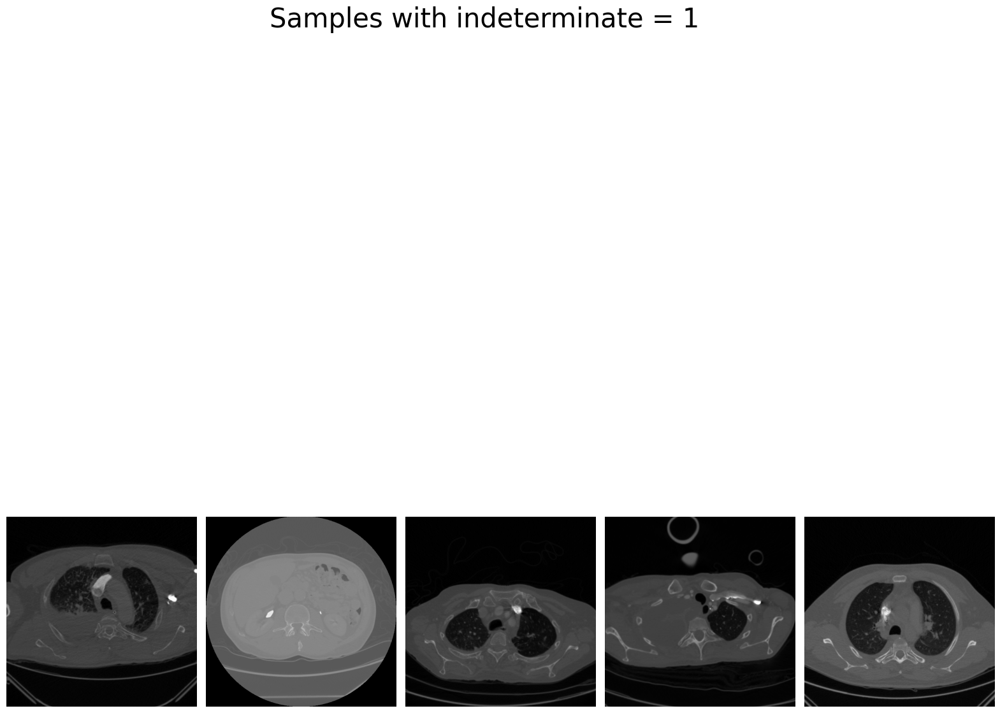

In [113]:
# Images Indeterminates
show_images_with_specific_condition('indeterminate')

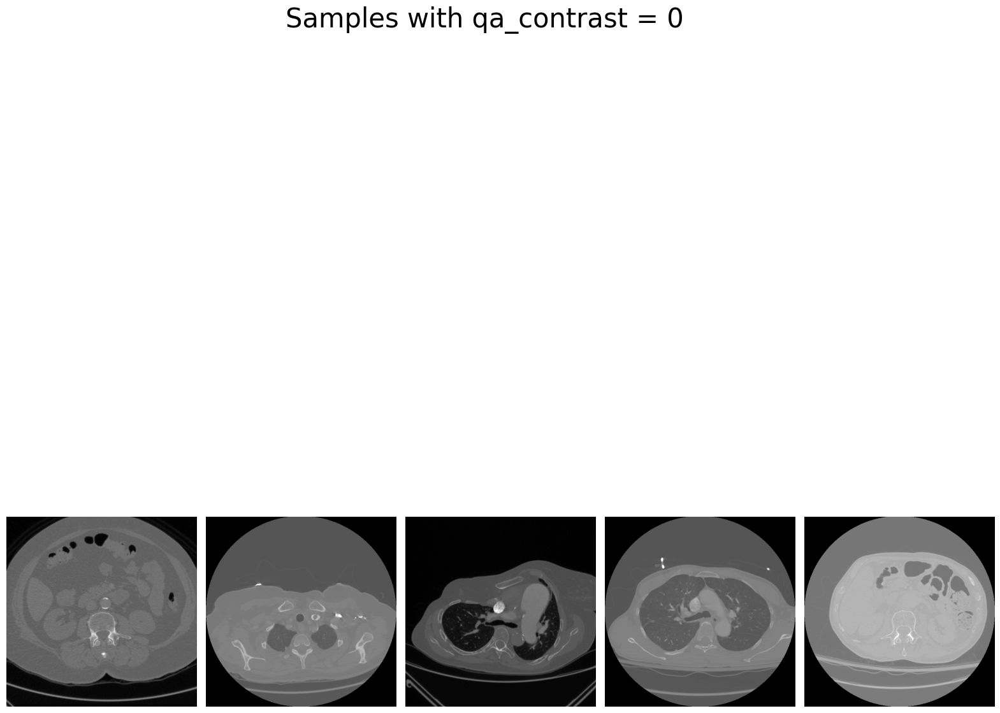

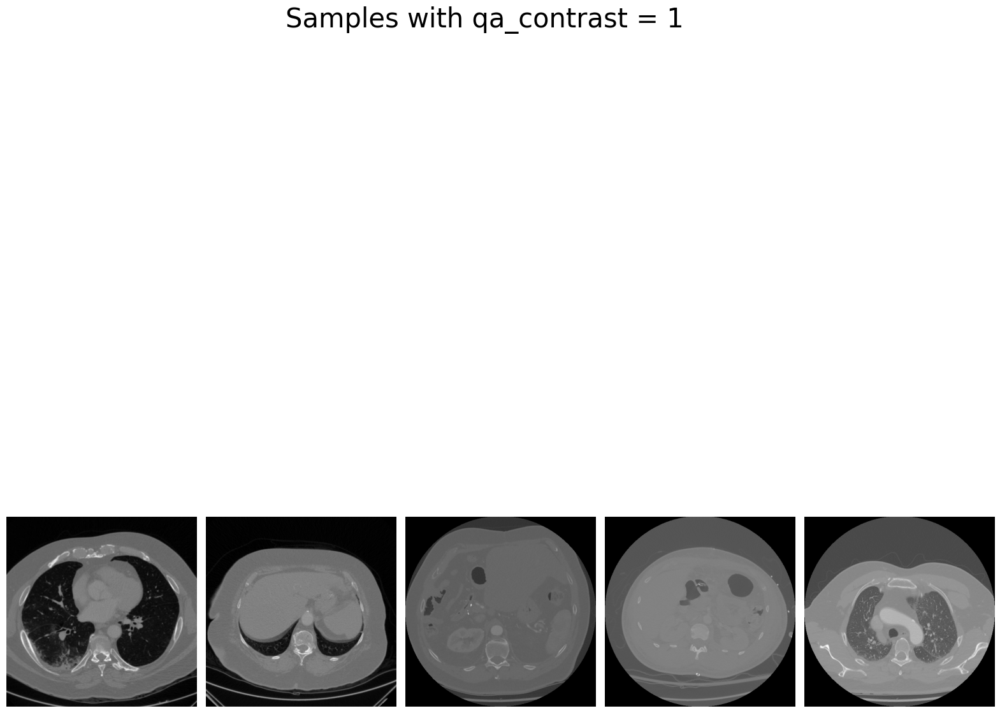

In [116]:
# Images with QA_Contrast
show_images_with_specific_condition('qa_contrast')

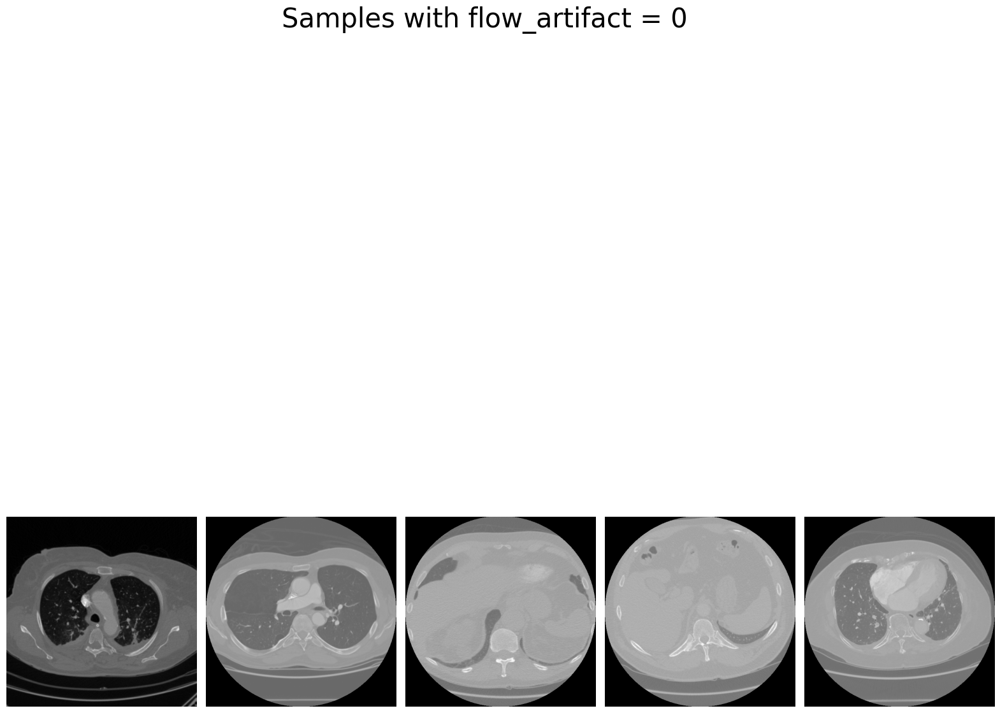

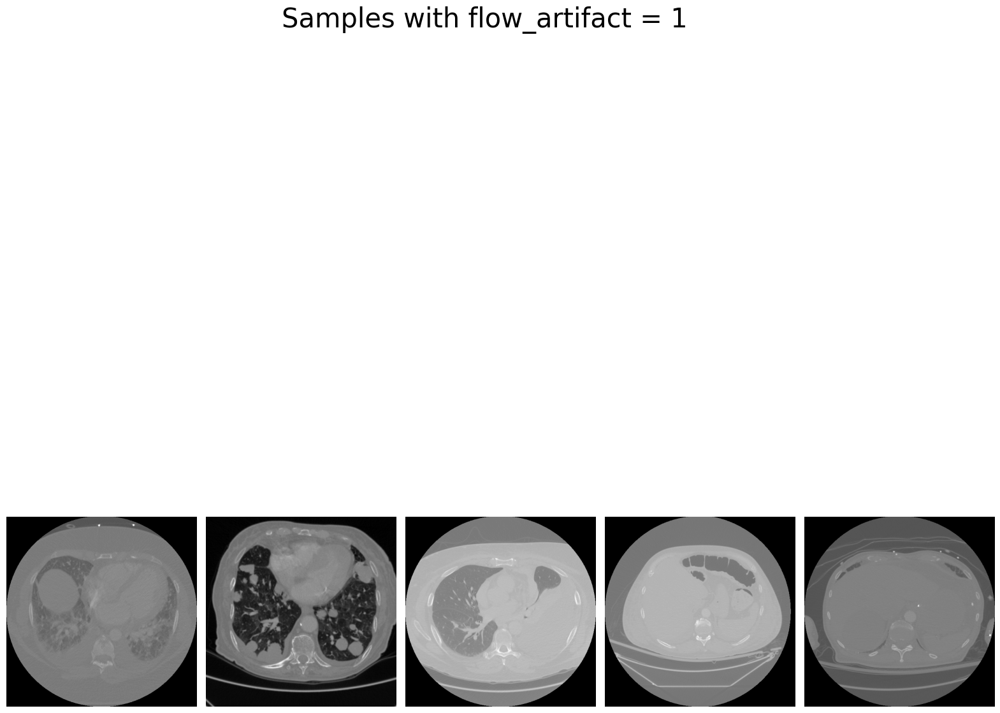

In [120]:
# Images Flow artifact
show_images_with_specific_condition('flow_artifact')

--- Train: 
Total Unique Studies&Series: 7,279
Min No. Images/Study: 63
Max No. Images/Study: 1,083
Avg No. Images/Study: 246


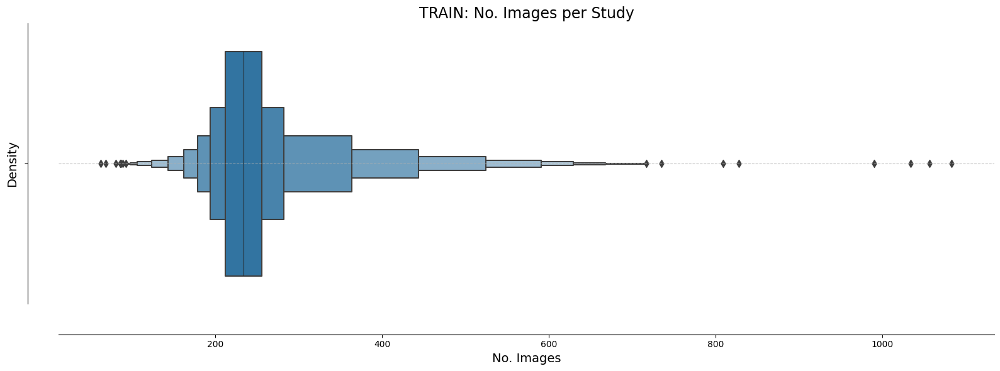

In [128]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

unique_studies = train_df['StudyInstanceUID'].nunique()
print(f"--- Train: \nTotal Unique Studies&Series: {unique_studies:,}")

study_group = train_df.groupby("StudyInstanceUID")["SOPInstanceUID"].count().reset_index()
min_images_per_study = study_group["SOPInstanceUID"].min()
max_images_per_study = study_group["SOPInstanceUID"].max()
avg_images_per_study = study_group["SOPInstanceUID"].mean()

print(f"Min No. Images/Study: {min_images_per_study:,}\n"
      f"Max No. Images/Study: {max_images_per_study:,}\n"
      f"Avg No. Images/Study: {avg_images_per_study:,.0f}")

plt.figure(figsize=(16, 6))
sns.boxenplot(x=study_group["SOPInstanceUID"], color = 'green')
sns.despine(right=True, offset=35)
plt.title("TRAIN: No. Images per Study", fontsize=17)
plt.xlabel('No. Images', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)  
plt.tight_layout()
plt.show()

--- Test: 
Total Unique Studies&Series: 650
Min No. Images/Study: 87
Max No. Images/Study: 407
Avg No. Images/Study: 226


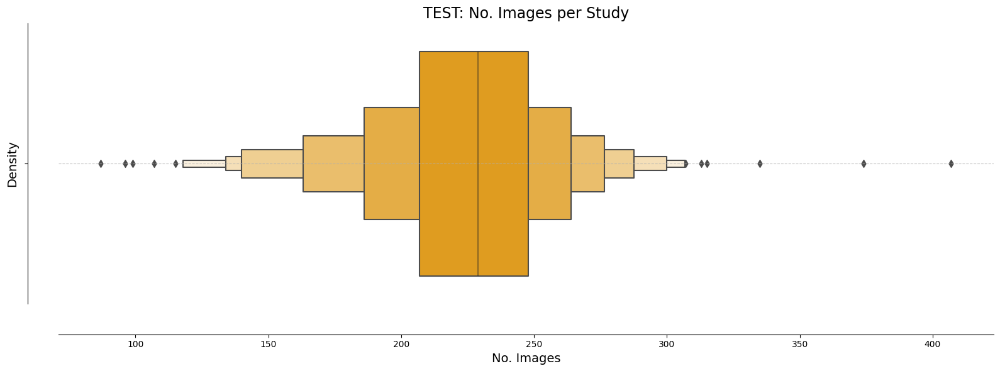

In [133]:
unique_studies_test = test_df['StudyInstanceUID'].nunique()
print(f"--- Test: \nTotal Unique Studies&Series: {unique_studies_test:,}")

study_group_test = test_df.groupby("StudyInstanceUID")["SOPInstanceUID"].count().reset_index()
min_images_per_study_test = study_group_test["SOPInstanceUID"].min()
max_images_per_study_test = study_group_test["SOPInstanceUID"].max()
avg_images_per_study_test = study_group_test["SOPInstanceUID"].mean()

print(f"Min No. Images/Study: {min_images_per_study_test:,}\n"
      f"Max No. Images/Study: {max_images_per_study_test:,}\n"
      f"Avg No. Images/Study: {avg_images_per_study_test:,.0f}")

plt.figure(figsize=(16, 6))
sns.boxenplot(x=study_group_test["SOPInstanceUID"], color='orange')
sns.despine(right=True, offset=35);
plt.title("TEST: No. Images per Study", fontsize=17)
plt.xlabel('No. Images', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


To understand more waht Study, Serie and Image correlation is 



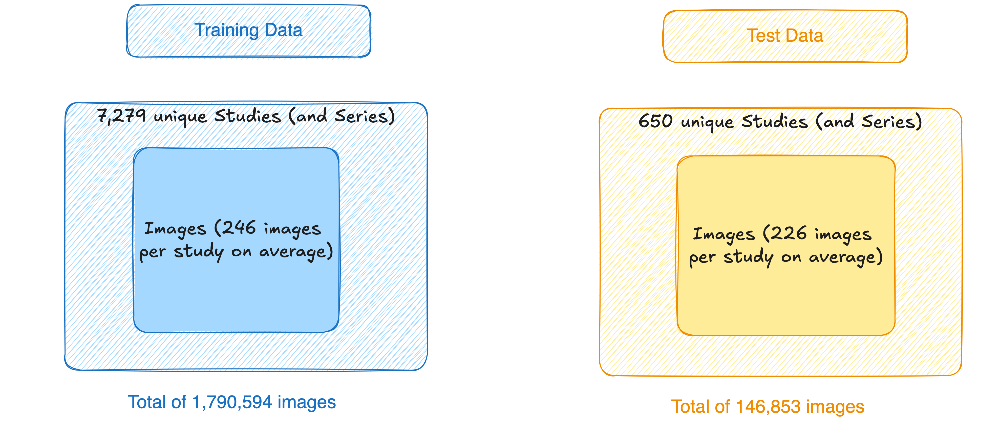

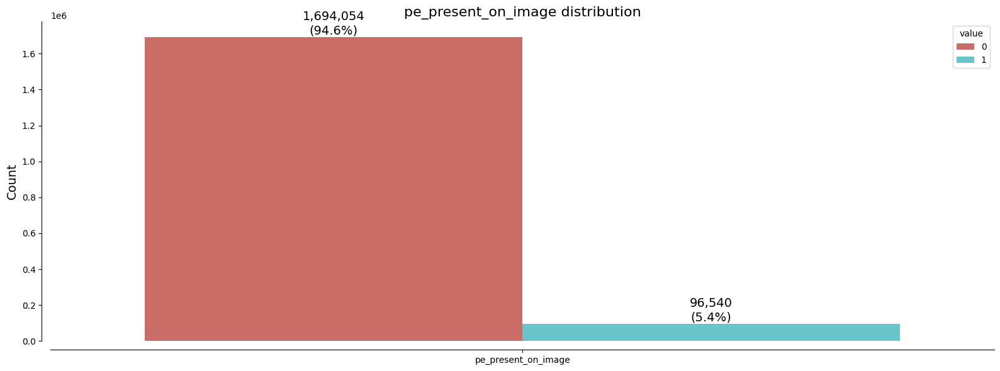

In [173]:
var = ['pe_present_on_image']
melt = train_df[['SOPInstanceUID'] + var]
melt = pd.melt(melt, id_vars=['SOPInstanceUID'], value_vars=var)
plt.figure(figsize=(16, 6))
a = sns.countplot(x=melt["variable"], hue=melt["value"], palette="hls")
sns.despine(right=True, offset=10)
plt.title("pe_present_on_image distribution", fontsize=16)
plt.xlabel("")
plt.ylabel("Count", fontsize=14)

total = len(melt)
for p in a.patches:
    count = int(p.get_height())
    percentage = count / total * 100
    a.annotate(f'{count:,}\n({percentage:.1f}%)', 
               (p.get_x() + p.get_width() / 2., p.get_height()), 
               ha='center', va='center', fontsize=14, color='black', 
               xytext=(0, 15), textcoords='offset points')  # Incremento de 10 en el eje y

plt.tight_layout()
plt.show()


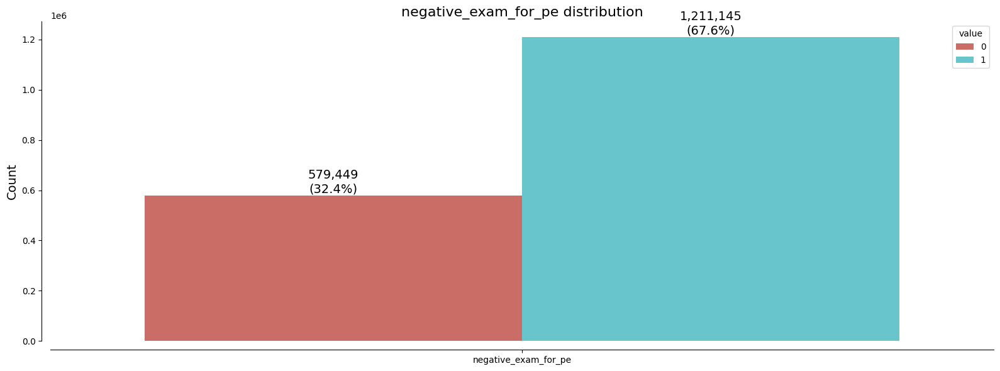

In [174]:
var = ['negative_exam_for_pe']
melt = train_df[['SOPInstanceUID'] + var]
melt = pd.melt(melt, id_vars=['SOPInstanceUID'], value_vars=var)

plt.figure(figsize=(16, 6))
a = sns.countplot(x=melt["variable"], hue=melt["value"], palette="hls")
sns.despine(right=True, offset=10)
plt.title("negative_exam_for_pe distribution", fontsize=16)
plt.xlabel("")
plt.ylabel("Count", fontsize=14)

total = len(melt)
for p in a.patches:
    count = int(p.get_height())
    percentage = count / total * 100
    a.annotate(f'{count:,}\n({percentage:.1f}%)', 
               (p.get_x() + p.get_width() / 2., p.get_height()), 
               ha='center', va='center', fontsize=14, color='black', 
               xytext=(0, 15), textcoords='offset points')  # Incremento de 10 en el eje y

plt.tight_layout()
plt.show()


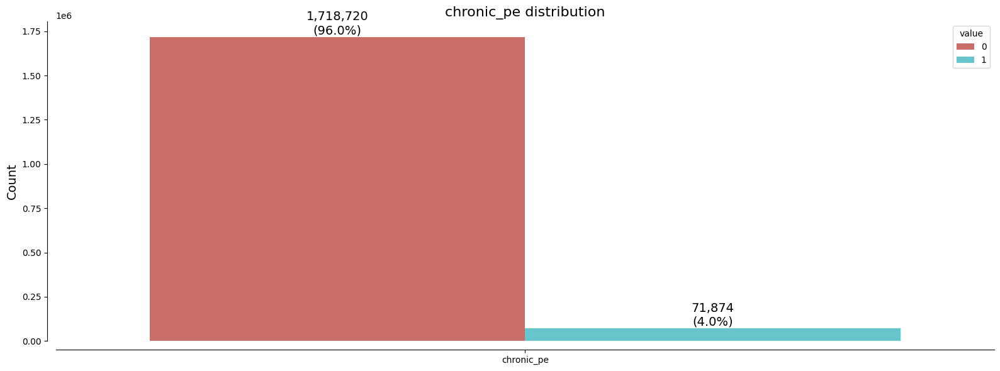

In [175]:
var =['chronic_pe']
melt = train_df[['SOPInstanceUID'] + var]
melt = pd.melt(melt, id_vars=['SOPInstanceUID'], value_vars=var)

plt.figure(figsize=(16, 6))

a = sns.countplot(x=melt["variable"], hue=melt["value"], palette="hls")
sns.despine(right=True, offset=10)
plt.title("chronic_pe distribution", fontsize=16)
plt.xlabel("")
plt.ylabel("Count", fontsize=14)

total = len(melt)
for p in a.patches:
    count = int(p.get_height())
    percentage = count / total * 100
    a.annotate(f'{count:,}\n({percentage:.1f}%)', 
               (p.get_x() + p.get_width() / 2., p.get_height()), 
               ha='center', va='center', fontsize=14, color='black', 
               xytext=(0, 15), textcoords='offset points')  

plt.tight_layout()
plt.show()

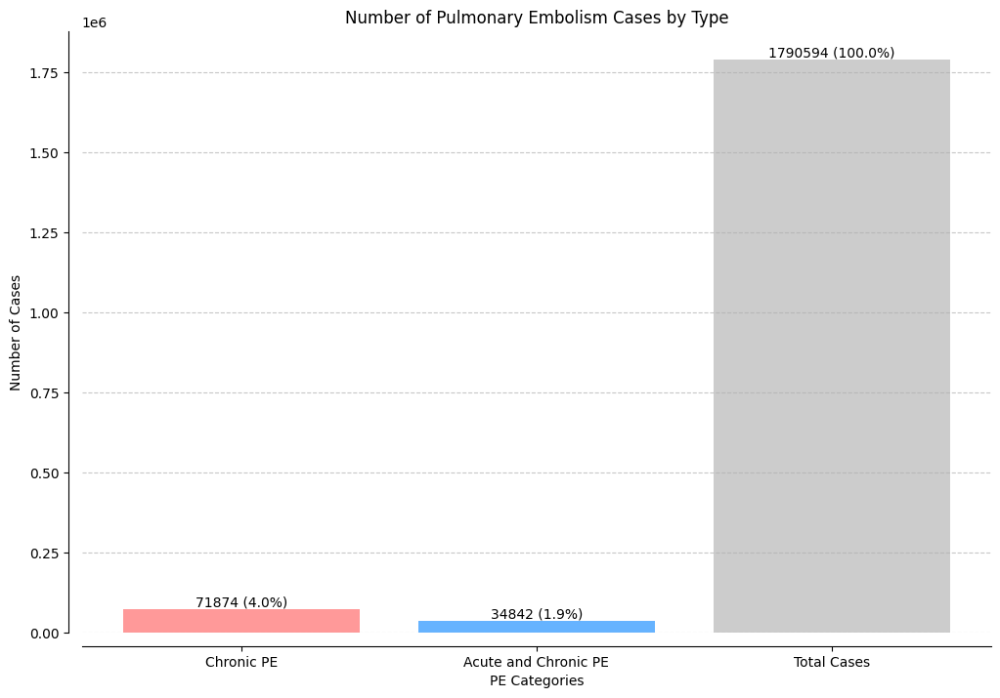

In [30]:
total_cases = train_df.shape[0]
chronic_cases = train_df['chronic_pe'].sum()
mixed_cases = train_df['acute_and_chronic_pe'].sum()

percent_chronic = (chronic_cases / total_cases) * 100
percent_mixed = (mixed_cases / total_cases) * 100

categories = ['Chronic PE', 'Acute and Chronic PE', 'Total Cases']
cases = [chronic_cases, mixed_cases, total_cases]
percentages = [percent_chronic, percent_mixed, 100]  
colors = ['#ff9999', '#66b3ff', '#cccccc']  # Added a new color for the total cases

plt.figure(figsize=(12, 8))
bars = plt.bar(categories, cases, color=colors)

plt.xlabel('PE Categories')
plt.ylabel('Number of Cases')
plt.title('Number of Pulmonary Embolism Cases by Type')
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.despine(right=True, offset=10)

for bar, percent in zip(bars, percentages):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{int(yval)} ({percent:.1f}%)', 
             va='bottom', ha='center', fontsize=10, color='black')

plt.show()

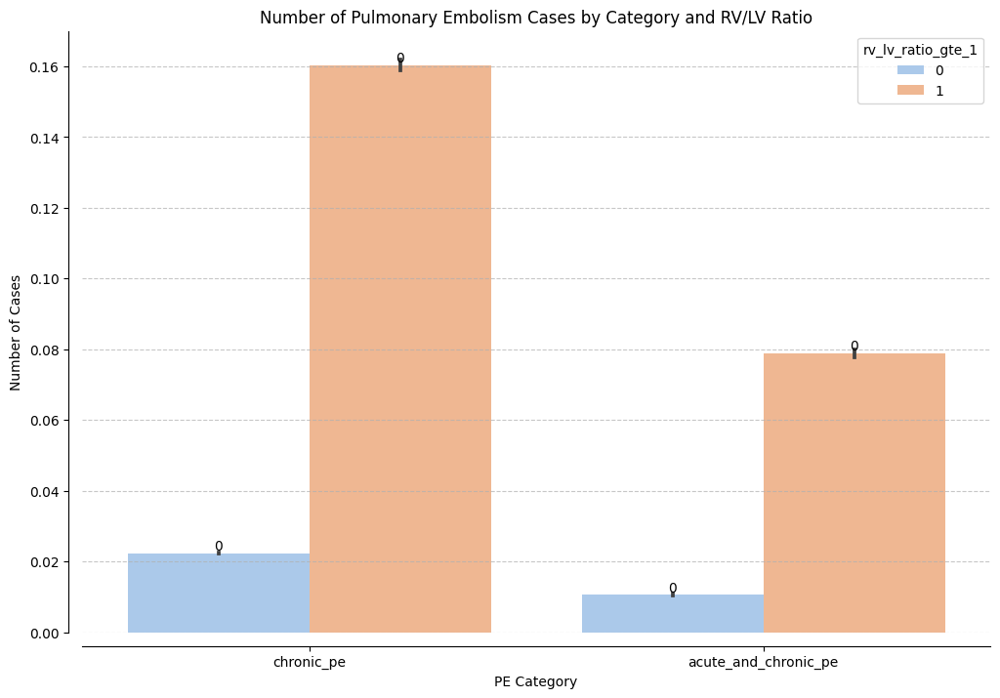

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

plot_df = pd.melt(train_df, 
                   id_vars=['rv_lv_ratio_gte_1'], 
                   value_vars=['chronic_pe', 'acute_and_chronic_pe'],
                   var_name='PE_Category', 
                   value_name='Count')

plt.figure(figsize=(12, 8))
bars = sns.barplot(data=plot_df, x='PE_Category', y='Count', hue='rv_lv_ratio_gte_1', palette='pastel')

plt.xlabel('PE Category')
plt.ylabel('Number of Cases')
plt.title('Number of Pulmonary Embolism Cases by Category and RV/LV Ratio')
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.despine(right=True, offset=10)

for bar in bars.patches:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{int(height)}',
             ha='center', va='bottom', fontsize=10, color='black')
plt.show()

In [73]:
#what happen with the ratios?

ratios_check = train_df[(train_df['rv_lv_ratio_gte_1'] == 1) & (train_df['rv_lv_ratio_lt_1'] == 1)]

print(ratios_check)

Empty DataFrame
Columns: [StudyInstanceUID, SeriesInstanceUID, SOPInstanceUID, pe_present_on_image, negative_exam_for_pe, qa_motion, qa_contrast, flow_artifact, rv_lv_ratio_gte_1, rv_lv_ratio_lt_1, leftsided_pe, chronic_pe, true_filling_defect_not_pe, rightsided_pe, acute_and_chronic_pe, central_pe, indeterminate, ID]
Index: []


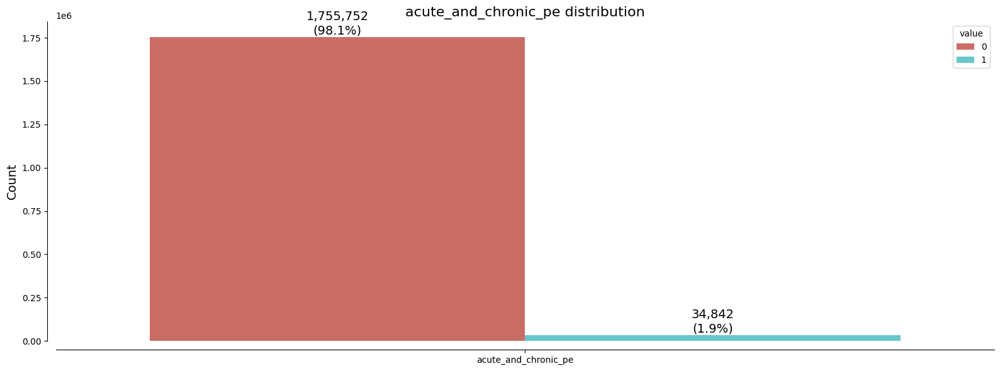

In [176]:
var = ['acute_and_chronic_pe']

melt = train_df[['SOPInstanceUID'] + var]
melt = pd.melt(melt, id_vars=['SOPInstanceUID'], value_vars=var)
plt.figure(figsize=(16, 6))

a = sns.countplot(x=melt["variable"], hue=melt["value"], palette="hls")
sns.despine(right=True, offset=10)
plt.title("acute_and_chronic_pe distribution", fontsize=16)
plt.xlabel("")
plt.ylabel("Count", fontsize=14)

total = len(melt)
for p in a.patches:
    count = int(p.get_height())
    percentage = count / total * 100
    a.annotate(f'{count:,}\n({percentage:.1f}%)', 
               (p.get_x() + p.get_width() / 2., p.get_height()), 
               ha='center', va='center', fontsize=14, color='black', 
               xytext=(0, 15), textcoords='offset points')  
    
plt.tight_layout()
plt.show()

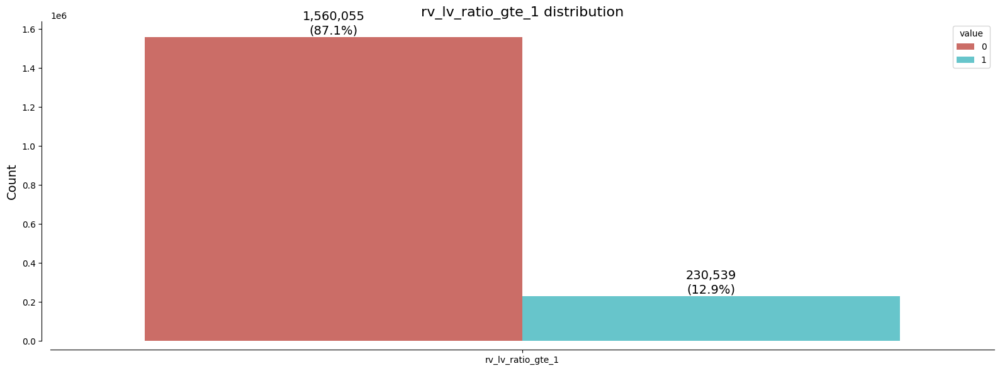

In [39]:
var = ['rv_lv_ratio_gte_1']

melt = train_df[['SOPInstanceUID'] + var]
melt = pd.melt(melt, id_vars=['SOPInstanceUID'], value_vars=var)
plt.figure(figsize=(16, 6))

a = sns.countplot(x=melt["variable"], hue=melt["value"], palette="hls")
sns.despine(right=True, offset=10)
plt.title("rv_lv_ratio_gte_1 distribution", fontsize=16)
plt.xlabel("")
plt.ylabel("Count", fontsize=14)

total = len(melt)
for p in a.patches:
    count = int(p.get_height())
    percentage = count / total * 100
    a.annotate(f'{count:,}\n({percentage:.1f}%)', 
               (p.get_x() + p.get_width() / 2., p.get_height()), 
               ha='center', va='center', fontsize=14, color='black', 
               xytext=(0, 15), textcoords='offset points')  

plt.tight_layout()
plt.show()

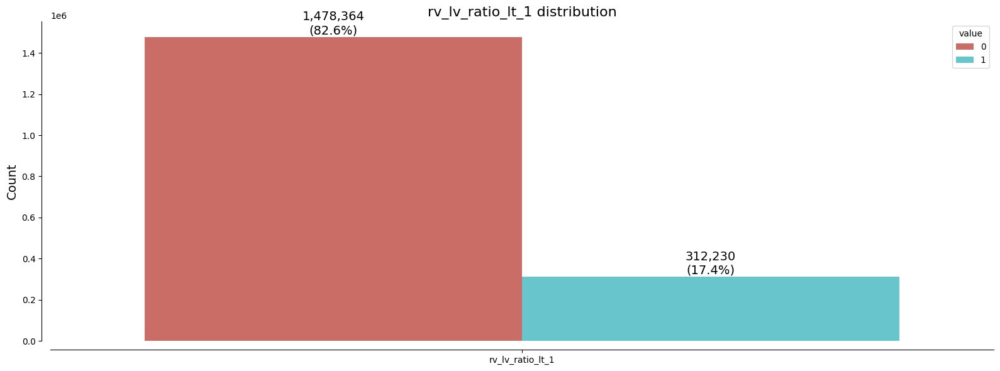

In [40]:
var = ['rv_lv_ratio_lt_1']

melt = train_df[['SOPInstanceUID'] + var]
melt = pd.melt(melt, id_vars=['SOPInstanceUID'], value_vars=var)
plt.figure(figsize=(16, 6))

a = sns.countplot(x=melt["variable"], hue=melt["value"], palette="hls")
sns.despine(right=True, offset=10)
plt.title("rv_lv_ratio_lt_1 distribution", fontsize=16)
plt.xlabel("")
plt.ylabel("Count", fontsize=14)

total = len(melt)
for p in a.patches:
    count = int(p.get_height())
    percentage = count / total * 100
    a.annotate(f'{count:,}\n({percentage:.1f}%)', 
               (p.get_x() + p.get_width() / 2., p.get_height()), 
               ha='center', va='center', fontsize=14, color='black', 
               xytext=(0, 15), textcoords='offset points')  

plt.tight_layout()
plt.show()

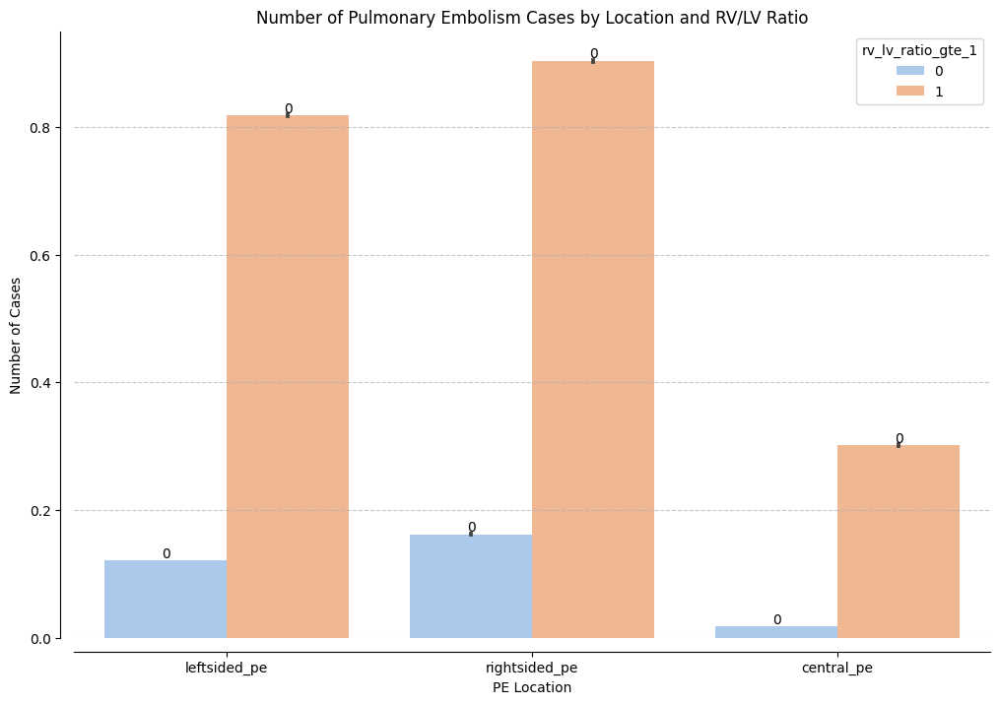

In [57]:

plot_df = pd.melt(train_df, 
                   id_vars=['rv_lv_ratio_gte_1'], 
                   value_vars=['leftsided_pe', 'rightsided_pe', 'central_pe'],
                   var_name='PE_Location', 
                   value_name='Count')

plt.figure(figsize=(12, 8))
bars = sns.barplot(data=plot_df, x='PE_Location', y='Count', hue='rv_lv_ratio_gte_1', palette='pastel')

plt.xlabel('PE Location')
plt.ylabel('Number of Cases')
plt.title('Number of Pulmonary Embolism Cases by Location and RV/LV Ratio')
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.despine(right=True, offset=10)

for bar in bars.patches:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{int(height)}',
             ha='center', va='bottom', fontsize=10, color='black')
plt.show()

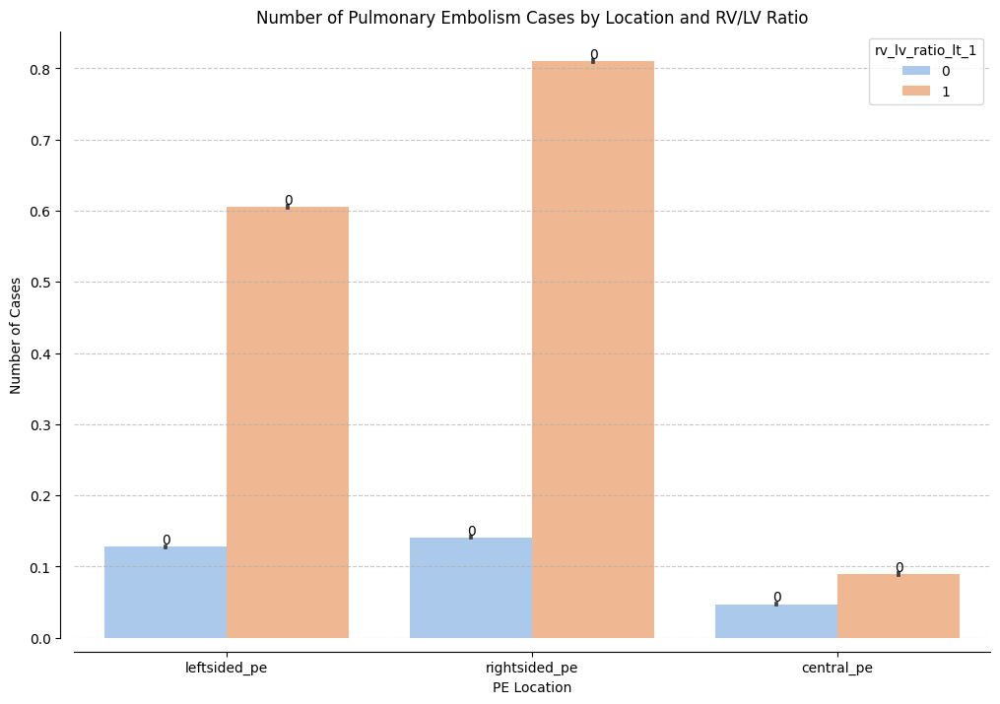

In [55]:

plot_df = pd.melt(train_df, 
                   id_vars=['rv_lv_ratio_lt_1'], 
                   value_vars=['leftsided_pe', 'rightsided_pe', 'central_pe'],
                   var_name='PE_Location', 
                   value_name='Count')

plt.figure(figsize=(12, 8))
bars = sns.barplot(data=plot_df, x='PE_Location', y='Count', hue='rv_lv_ratio_lt_1', palette='pastel')

plt.xlabel('PE Location')
plt.ylabel('Number of Cases')
plt.title('Number of Pulmonary Embolism Cases by Location and RV/LV Ratio')
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.despine(right=True, offset=10)

for bar in bars.patches:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{int(height)}',
             ha='center', va='bottom', fontsize=10, color='black')
plt.show()

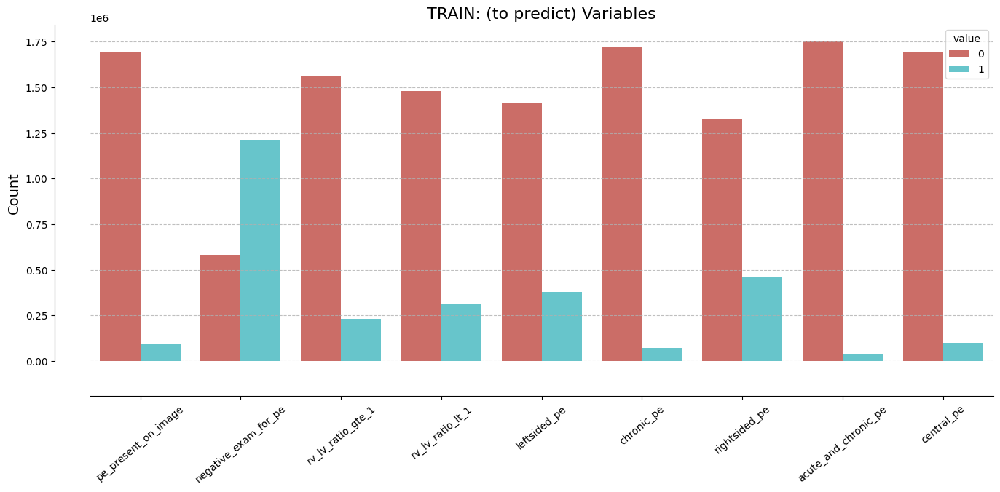

In [177]:
predict_variables = ['pe_present_on_image', 'negative_exam_for_pe', 'rv_lv_ratio_gte_1', 
                     'rv_lv_ratio_lt_1', 'leftsided_pe', 'chronic_pe', 'rightsided_pe', 
                     'acute_and_chronic_pe', 'central_pe']

melt = train_df[['SOPInstanceUID'] + predict_variables]
melt = pd.melt(melt, id_vars=['SOPInstanceUID'], value_vars=predict_variables)

plt.figure(figsize=(16, 6))

a = sns.countplot(x=melt["variable"], hue=melt["value"], 
                  palette="hls")
sns.despine(right=True, offset=35);
plt.xticks(rotation=40)
plt.grid(axis='y', linestyle='--', alpha=0.8)
plt.title("TRAIN: (to predict) Variables", fontsize = 16)
plt.xlabel("")
plt.ylabel("Count", fontsize=14);

There are also 5 features that are intended only to be helpers.

- 'qa_motion'
- 'qa_contrast'
- 'flow_artifact'
- 'true_filling_defect_not_pe'
- 'indeterminate'


📌Note: All features hase very low frequencies for present (or 1). These represent notes from radiologists, however we can't count on these, as there could be human error involved.

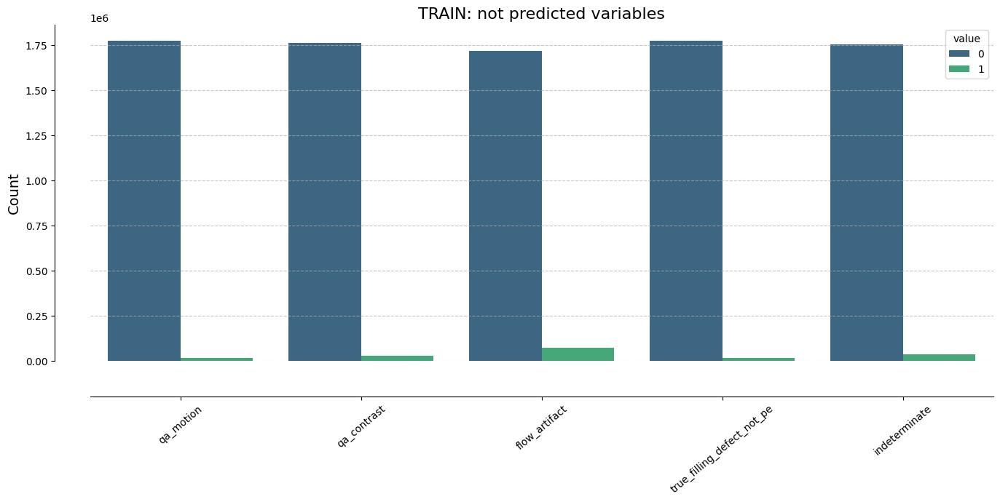

In [153]:
bonus_variables = ['qa_motion', 'qa_contrast', 'flow_artifact', 'true_filling_defect_not_pe','indeterminate']

melt = train_df[['SOPInstanceUID'] + bonus_variables]
melt = pd.melt(melt, id_vars=['SOPInstanceUID'], value_vars=bonus_variables)

plt.figure(figsize=(16, 6))

sns.countplot(x=melt["variable"], hue=melt["value"], 
                  palette="viridis")
sns.despine(right=True, offset=35);
plt.xticks(rotation=40)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.title("TRAIN: not predicted variables", fontsize = 16)
plt.xlabel("")
plt.ylabel("Count", fontsize=14);

In [148]:
bonus_variables = ['qa_motion', 'qa_contrast', 'flow_artifact', 'true_filling_defect_not_pe', 'indeterminate']

total_counts = train_df[bonus_variables].sum()
for variable, count in total_counts.items():
    print(f" Times that variable '{variable}' appears: {count:,}")
    
total_ones = train_df[bonus_variables].sum().sum()
print(f"Total: {total_ones:,}")

 Times that variable 'qa_motion' appears: 14,774
 Times that variable 'qa_contrast' appears: 28,286
 Times that variable 'flow_artifact' appears: 71,908
 Times that variable 'true_filling_defect_not_pe' appears: 14,391
 Times that variable 'indeterminate' appears: 36,680
Total: 166,039


📌 We will have to delete this 166,039 files

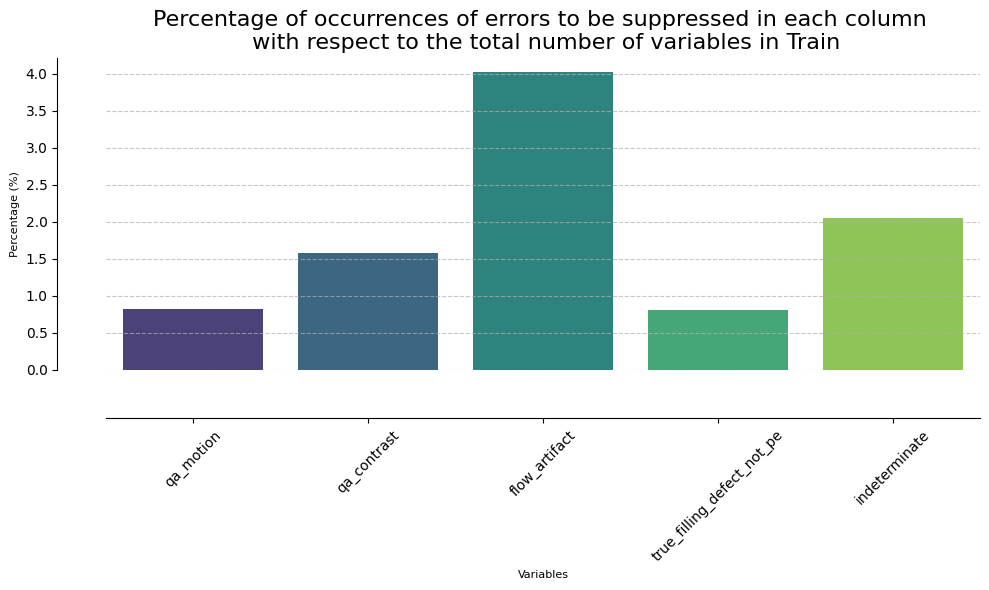

In [152]:
# Asumiendo que train_df ya está definido y contiene las columnas de interés

# Lista de columnas a analizar
bonus_variables = ['qa_motion', 'qa_contrast', 'flow_artifact', 'true_filling_defect_not_pe', 'indeterminate']

# Contar el total de '1' en cada columna
total_counts = train_df[bonus_variables].sum()

# Calcular el porcentaje de '1' respecto al total de filas
total_rows = len(train_df)
percentages = (total_counts / total_rows) * 100

# Crear el plot
plt.figure(figsize=(10, 6))
sns.barplot(x=percentages.index, y=percentages.values, palette='viridis')
sns.despine(right=True, offset=35);
plt.title('Percentage of occurrences of errors to be suppressed in each column \n with respect to the total number of variables in Train', fontsize=16)
plt.xlabel('Variables', fontsize=8)
plt.ylabel('Percentage (%)', fontsize=8)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

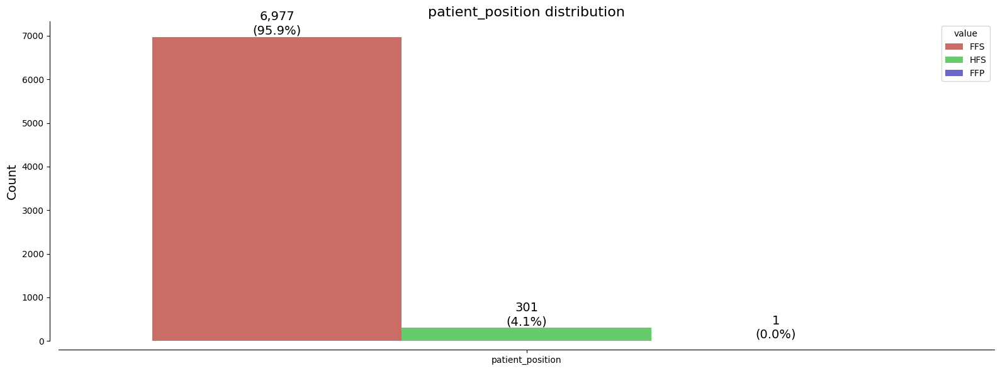

In [181]:
var = ['patient_position']

melt = scan_properties[var]
melt = pd.melt(melt, value_vars=var)

plt.figure(figsize=(16, 6))

a = sns.countplot(x=melt["variable"], hue=melt["value"], palette="hls")
sns.despine(right=True, offset=10)
plt.title("patient_position distribution", fontsize=16)
plt.xlabel("")
plt.ylabel("Count", fontsize=14)

total = len(melt)
for p in a.patches:
    count = int(p.get_height())
    percentage = count / total * 100
    a.annotate(f'{count:,}\n({percentage:.1f}%)', 
               (p.get_x() + p.get_width() / 2., p.get_height()), 
               ha='center', va='center', fontsize=14, color='black', 
               xytext=(0, 15), textcoords='offset points')  # Incremento de 10 en el eje y

plt.tight_layout()
plt.show()

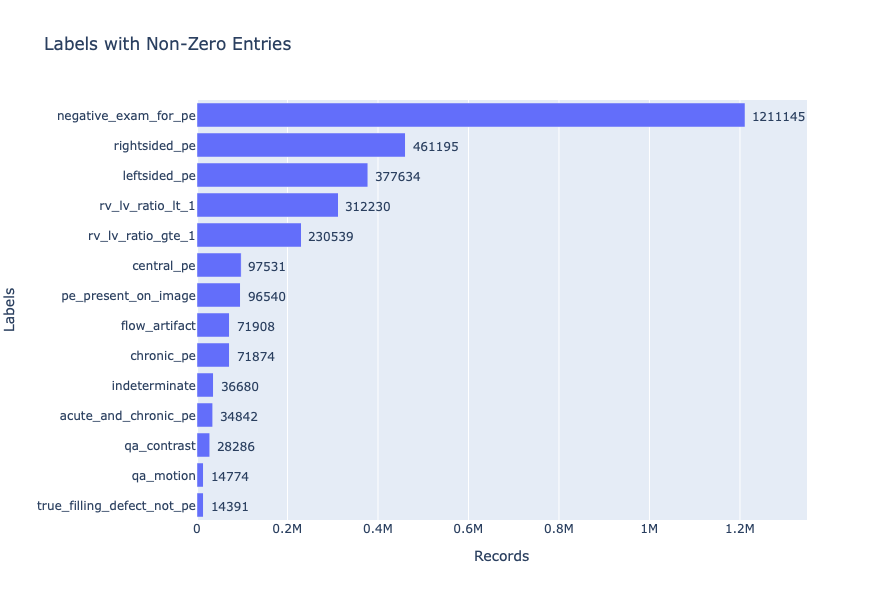

In [11]:
import numpy as np
import pandas as pd
import plotly.express as px

x = train_df.drop(['StudyInstanceUID', 'SeriesInstanceUID', 'SOPInstanceUID'], axis=1).sum(axis=0).sort_values().reset_index()
x.columns = ['Labels', 'Records']

fig = px.bar(
    x, 
    x='Records', 
    y='Labels', 
    orientation='h', 
    title='Labels with Non-Zero Entries', 
    height=600, 
    width=800
)

for index, row in x.iterrows():
    fig.add_annotation(
        x=row['Records'],
        y=row['Labels'],
        text=str(row['Records']),
        showarrow=False,
        font=dict(size=12),
        xanchor='left',  
        xshift=5  
    )

fig.show()

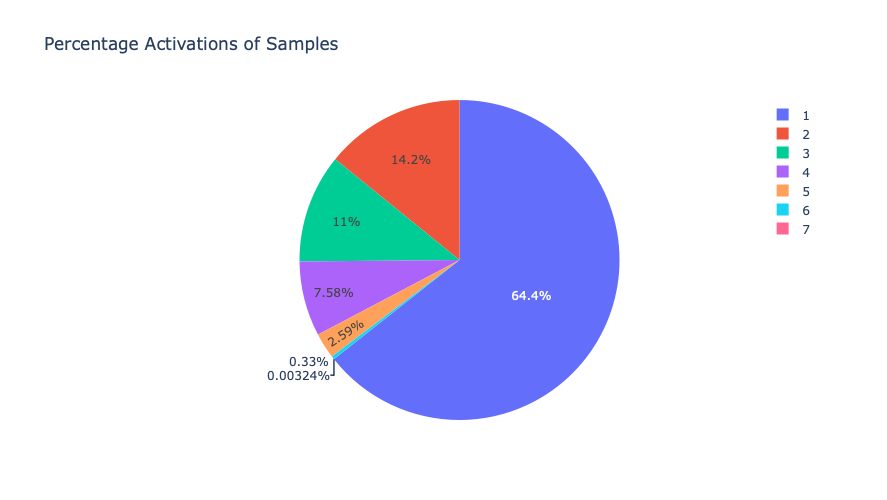

In [8]:
data = train_df.drop(['StudyInstanceUID', 'SeriesInstanceUID', 'SOPInstanceUID'], axis=1).astype(bool).sum(axis=1).reset_index()
data.columns = ['row', 'counts']
data = data.groupby(['counts'])['row'].count().reset_index()
fig = px.pie(
    data, 
    values=100 * data['row']/len(train_df), 
    names="counts", 
    title='Percentage Activations of Samples', 
    width=800, 
    height=500
)

fig.show()


In [18]:
train_df

,StudyInstanceUID,SeriesInstanceUID,SOPInstanceUID,pe_present_on_image,negative_exam_for_pe,qa_motion,qa_contrast,flow_artifact,rv_lv_ratio_gte_1,rv_lv_ratio_lt_1,leftsided_pe,chronic_pe,true_filling_defect_not_pe,rightsided_pe,acute_and_chronic_pe,central_pe,indeterminate
0,6897fa9de148,2bfbb7fd2e8b,c0f3cb036d06,0,0,0,0,0,0,1,1,0,0,1,0,0,0
1,6897fa9de148,2bfbb7fd2e8b,f57ffd3883b6,0,0,0,0,0,0,1,1,0,0,1,0,0,0
2,6897fa9de148,2bfbb7fd2e8b,41220fda34a3,0,0,0,0,0,0,1,1,0,0,1,0,0,0
3,6897fa9de148,2bfbb7fd2e8b,13b685b4b14f,0,0,0,0,0,0,1,1,0,0,1,0,0,0
4,6897fa9de148,2bfbb7fd2e8b,be0b7524ffb4,0,0,0,0,0,0,1,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1790589,4833c9b6a5d0,57e3e3c5f910,da0ecef50cf5,0,0,0,0,0,0,1,1,1,0,0,0,0,0
1790590,4833c9b6a5d0,57e3e3c5f910,d74b46c2f2c4,0,0,0,0,0,0,1,1,1,0,0,0,0,0
1790591,4833c9b6a5d0,57e3e3c5f910,ba71189191ad,0,0,0,0,0,0,1,1,1,0,0,0,0,0
1790592,4833c9b6a5d0,57e3e3c5f910,f4fdc88f2ace,0,0,0,0,0,0,1,1,1,0,0,0,0,0


In [61]:
train_to_merge = train_df
train_to_merge['ID'] = train_to_merge['StudyInstanceUID'] + '_' + train_to_merge['SeriesInstanceUID']

In [62]:
merged_df = pd.merge(train_to_merge, scan_properties, on='ID', how='inner')

In [21]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1790594 entries, 0 to 1790593
Data columns (total 40 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   StudyInstanceUID            object 
 1   SeriesInstanceUID           object 
 2   SOPInstanceUID              object 
 3   pe_present_on_image         int64  
 4   negative_exam_for_pe        int64  
 5   qa_motion                   int64  
 6   qa_contrast                 int64  
 7   flow_artifact               int64  
 8   rv_lv_ratio_gte_1           int64  
 9   rv_lv_ratio_lt_1            int64  
 10  leftsided_pe                int64  
 11  chronic_pe                  int64  
 12  true_filling_defect_not_pe  int64  
 13  rightsided_pe               int64  
 14  acute_and_chronic_pe        int64  
 15  central_pe                  int64  
 16  indeterminate               int64  
 17  ID                          object 
 18  rows                        int64  
 19  columns              

In [75]:
df = train_df

        StudyInstanceUID SeriesInstanceUID SOPInstanceUID  \
0           6897fa9de148      2bfbb7fd2e8b   c0f3cb036d06   
1           6897fa9de148      2bfbb7fd2e8b   f57ffd3883b6   
2           6897fa9de148      2bfbb7fd2e8b   41220fda34a3   
3           6897fa9de148      2bfbb7fd2e8b   13b685b4b14f   
4           6897fa9de148      2bfbb7fd2e8b   be0b7524ffb4   
...                  ...               ...            ...   
1790589     4833c9b6a5d0      57e3e3c5f910   da0ecef50cf5   
1790590     4833c9b6a5d0      57e3e3c5f910   d74b46c2f2c4   
1790591     4833c9b6a5d0      57e3e3c5f910   ba71189191ad   
1790592     4833c9b6a5d0      57e3e3c5f910   f4fdc88f2ace   
1790593     4833c9b6a5d0      57e3e3c5f910   f890efd48940   

         pe_present_on_image  negative_exam_for_pe  qa_motion  qa_contrast  \
0                          0                     0          0            0   
1                          0                     0          0            0   
2                          0     

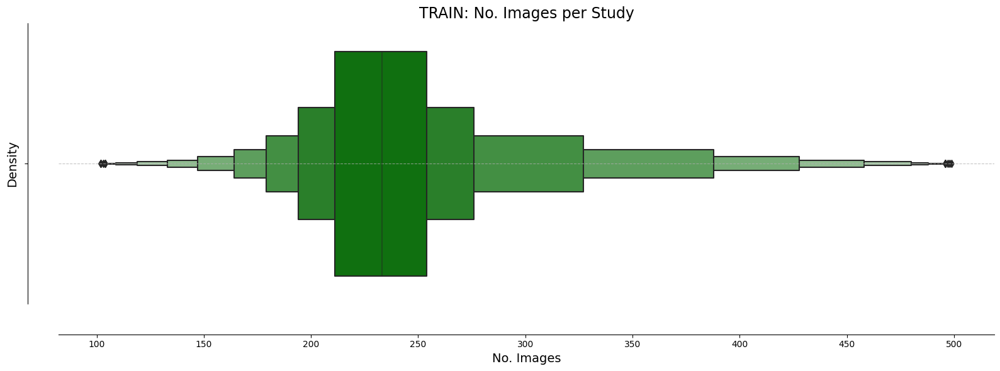

In [77]:
import pandas as pd

# Supongamos que 'df' es tu DataFrame original y contiene las columnas 'StudyInstanceUID' y 'SOPInstanceUID'

# Agrupar por 'StudyInstanceUID' y contar el número de 'SOPInstanceUID' (imágenes) por estudio
study_image_counts = df.groupby("StudyInstanceUID")["SOPInstanceUID"].count().reset_index()

# Renombrar la columna de conteo para mayor claridad
study_image_counts.rename(columns={'SOPInstanceUID': 'number_of_images_per_study'}, inplace=True)

# Filtrar estudios con más de 100 y menos de 500 imágenes
filtered_studies = study_image_counts[(study_image_counts['number_of_images_per_study'] > 100) & 
                                      (study_image_counts['number_of_images_per_study'] < 500)]

# Combinar los datos filtrados con el DataFrame original para obtener sólo las filas deseadas
filtered_df_nums = df[df['StudyInstanceUID'].isin(filtered_studies['StudyInstanceUID'])]

# Verificar el resultado
print(filtered_df_nums)


# Número de estudios únicos
unique_studies = filtered_df_nums['StudyInstanceUID'].nunique()
print(f"--- Train: \nTotal Unique Studies&Series: {unique_studies:,}")

# Agrupación por estudio
study_group = filtered_df_nums.groupby("StudyInstanceUID")["SOPInstanceUID"].count().reset_index()
min_images_per_study = study_group["SOPInstanceUID"].min()
max_images_per_study = study_group["SOPInstanceUID"].max()
avg_images_per_study = study_group["SOPInstanceUID"].mean()

print(f"Min No. Images/Study: {min_images_per_study:,}\n"
      f"Max No. Images/Study: {max_images_per_study:,}\n"
      f"Avg No. Images/Study: {avg_images_per_study:,.0f}")

# Gráfico
plt.figure(figsize=(16, 6))
sns.boxenplot(x=study_group["SOPInstanceUID"], color = 'green')
sns.despine(right=True, offset=35)
plt.title("TRAIN: No. Images per Study", fontsize=17)
plt.xlabel('No. Images', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Añadir líneas de rejilla para mejor legibilidad
plt.tight_layout()
plt.show()

In [78]:
merged_df = pd.merge(filtered_df_nums, scan_properties, on='ID', how='inner')

In [79]:
filtered_df = merged_df[merged_df['flow_artifact'] != 1]
filtered_df = filtered_df[filtered_df['qa_motion'] != 1]
filtered_df = filtered_df[filtered_df['qa_contrast'] != 1]
filtered_df = filtered_df[filtered_df['flow_artifact'] != 1]
filtered_df = filtered_df[filtered_df['true_filling_defect_not_pe'] != 1]
filtered_df = filtered_df[filtered_df['indeterminate'] != 1]

In [80]:
merged_df

,StudyInstanceUID,SeriesInstanceUID,SOPInstanceUID,pe_present_on_image,negative_exam_for_pe,qa_motion,qa_contrast,flow_artifact,rv_lv_ratio_gte_1,rv_lv_ratio_lt_1,...,table_height,x_ray_tube_current,exposure,patient_position,detector_tilt,bits_allocated,rescale_intercept,rescale_slope,photometric_interpretation,convolution_kernel
0,6897fa9de148,2bfbb7fd2e8b,c0f3cb036d06,0,0,0,0,0,0,1,...,139.0,964,124,HFS,0.0,16,-1024.0,1.0,MONOCHROME2,B30f
1,6897fa9de148,2bfbb7fd2e8b,f57ffd3883b6,0,0,0,0,0,0,1,...,139.0,964,124,HFS,0.0,16,-1024.0,1.0,MONOCHROME2,B30f
2,6897fa9de148,2bfbb7fd2e8b,41220fda34a3,0,0,0,0,0,0,1,...,139.0,964,124,HFS,0.0,16,-1024.0,1.0,MONOCHROME2,B30f
3,6897fa9de148,2bfbb7fd2e8b,13b685b4b14f,0,0,0,0,0,0,1,...,139.0,964,124,HFS,0.0,16,-1024.0,1.0,MONOCHROME2,B30f
4,6897fa9de148,2bfbb7fd2e8b,be0b7524ffb4,0,0,0,0,0,0,1,...,139.0,964,124,HFS,0.0,16,-1024.0,1.0,MONOCHROME2,B30f
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1704262,4833c9b6a5d0,57e3e3c5f910,da0ecef50cf5,0,0,0,0,0,0,1,...,145.0,292,102,FFS,0.0,16,0.0,1.0,MONOCHROME2,FC08-H
1704263,4833c9b6a5d0,57e3e3c5f910,d74b46c2f2c4,0,0,0,0,0,0,1,...,145.0,292,102,FFS,0.0,16,0.0,1.0,MONOCHROME2,FC08-H
1704264,4833c9b6a5d0,57e3e3c5f910,ba71189191ad,0,0,0,0,0,0,1,...,145.0,292,102,FFS,0.0,16,0.0,1.0,MONOCHROME2,FC08-H
1704265,4833c9b6a5d0,57e3e3c5f910,f4fdc88f2ace,0,0,0,0,0,0,1,...,145.0,292,102,FFS,0.0,16,0.0,1.0,MONOCHROME2,FC08-H


In [81]:
filtered_df

,StudyInstanceUID,SeriesInstanceUID,SOPInstanceUID,pe_present_on_image,negative_exam_for_pe,qa_motion,qa_contrast,flow_artifact,rv_lv_ratio_gte_1,rv_lv_ratio_lt_1,...,table_height,x_ray_tube_current,exposure,patient_position,detector_tilt,bits_allocated,rescale_intercept,rescale_slope,photometric_interpretation,convolution_kernel
0,6897fa9de148,2bfbb7fd2e8b,c0f3cb036d06,0,0,0,0,0,0,1,...,139.0,964,124,HFS,0.0,16,-1024.0,1.0,MONOCHROME2,B30f
1,6897fa9de148,2bfbb7fd2e8b,f57ffd3883b6,0,0,0,0,0,0,1,...,139.0,964,124,HFS,0.0,16,-1024.0,1.0,MONOCHROME2,B30f
2,6897fa9de148,2bfbb7fd2e8b,41220fda34a3,0,0,0,0,0,0,1,...,139.0,964,124,HFS,0.0,16,-1024.0,1.0,MONOCHROME2,B30f
3,6897fa9de148,2bfbb7fd2e8b,13b685b4b14f,0,0,0,0,0,0,1,...,139.0,964,124,HFS,0.0,16,-1024.0,1.0,MONOCHROME2,B30f
4,6897fa9de148,2bfbb7fd2e8b,be0b7524ffb4,0,0,0,0,0,0,1,...,139.0,964,124,HFS,0.0,16,-1024.0,1.0,MONOCHROME2,B30f
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1704262,4833c9b6a5d0,57e3e3c5f910,da0ecef50cf5,0,0,0,0,0,0,1,...,145.0,292,102,FFS,0.0,16,0.0,1.0,MONOCHROME2,FC08-H
1704263,4833c9b6a5d0,57e3e3c5f910,d74b46c2f2c4,0,0,0,0,0,0,1,...,145.0,292,102,FFS,0.0,16,0.0,1.0,MONOCHROME2,FC08-H
1704264,4833c9b6a5d0,57e3e3c5f910,ba71189191ad,0,0,0,0,0,0,1,...,145.0,292,102,FFS,0.0,16,0.0,1.0,MONOCHROME2,FC08-H
1704265,4833c9b6a5d0,57e3e3c5f910,f4fdc88f2ace,0,0,0,0,0,0,1,...,145.0,292,102,FFS,0.0,16,0.0,1.0,MONOCHROME2,FC08-H


In [83]:
final_df = filtered_df

<Axes: >

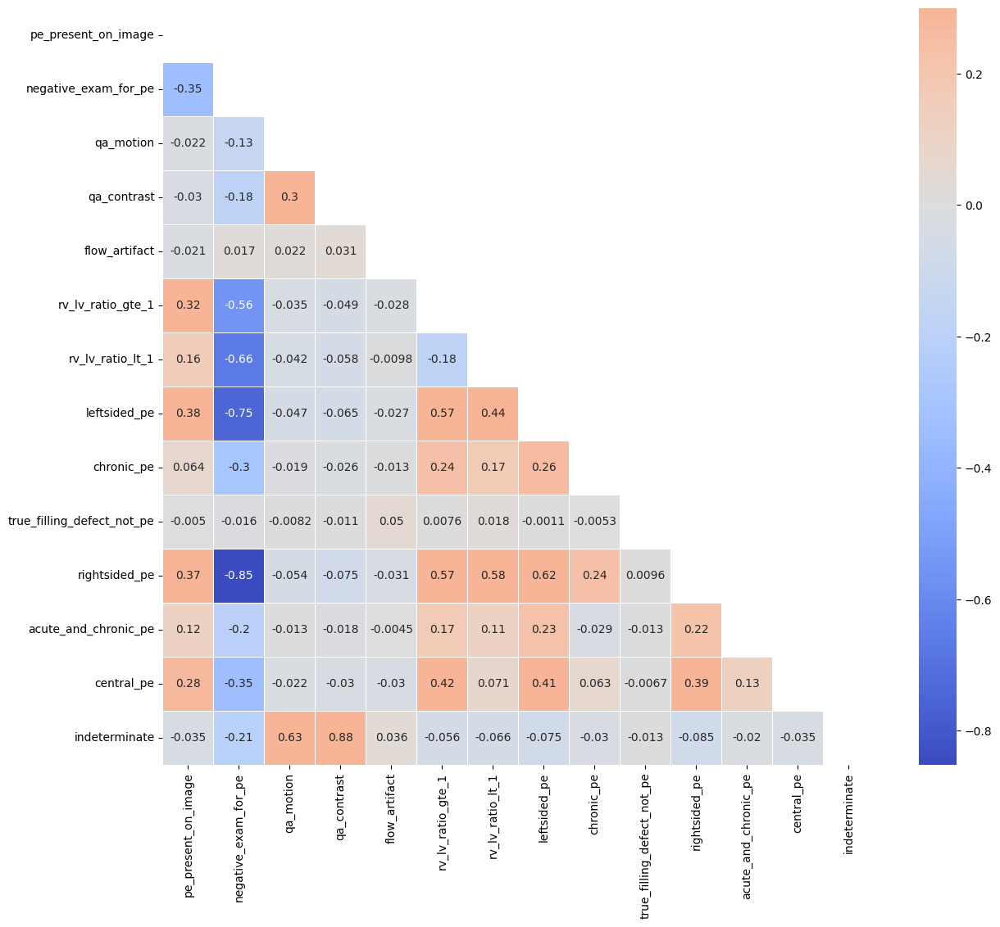

In [10]:
# Original DF
corr_mat = train_df[train_cols].corr()
mask = np.triu(np.ones_like(corr_mat, dtype=bool))
f, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(corr_mat, mask = mask, annot = True, vmax = 0.3, square = False, linewidths = 0.5, center = 0, cmap='coolwarm')

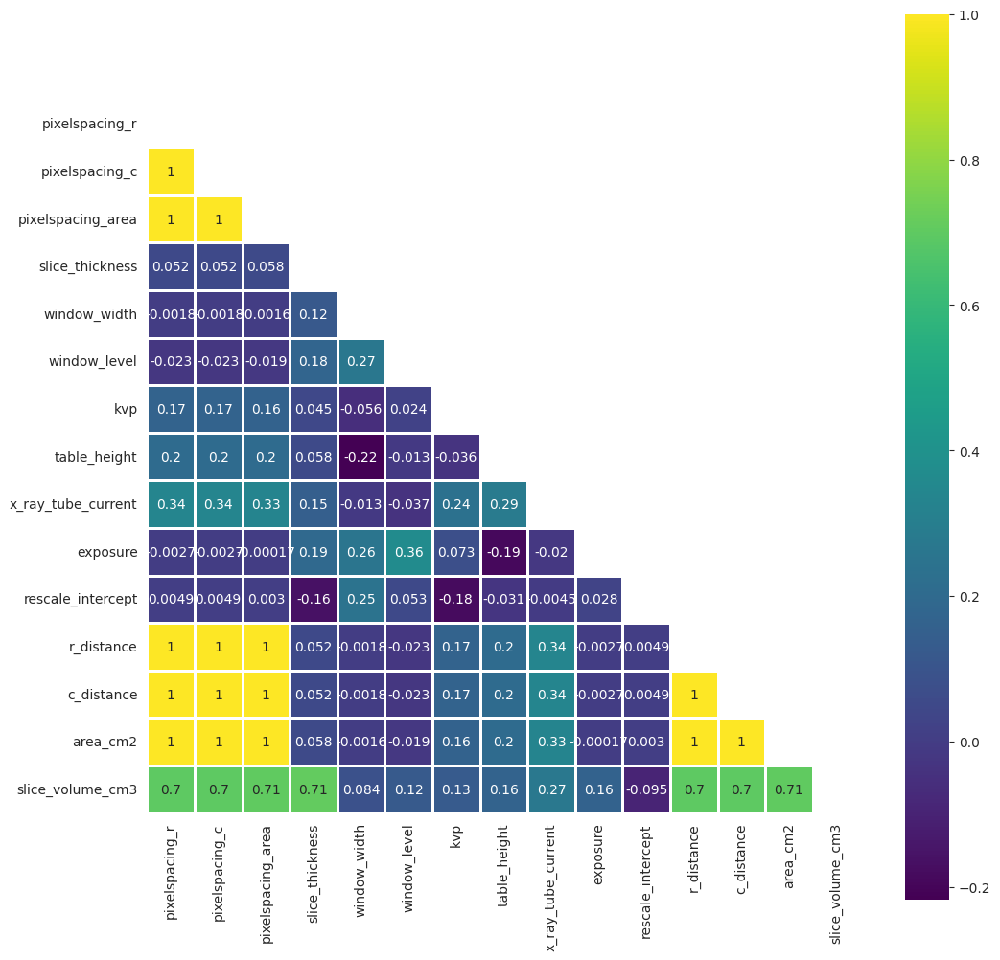

In [46]:
scan_cols = scan_properties.copy()
scan_cols.drop(['rows', 'columns', 'area', 'detector_tilt', 'bits_allocated', 'rescale_slope'], axis=1, inplace=True)
scan_cols = scan_cols.select_dtypes(include=[np.number])
corr = scan_cols.corr()

# Create a mask for the upper triangle
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(12, 12))
    ax = sns.heatmap(corr, mask=mask, square=True, linewidths=.8, cmap="viridis", annot=True)
plt.show()

We can see an unusual heatmap this is because:

📌 Most of our values are dervied which makes some features highly correlated

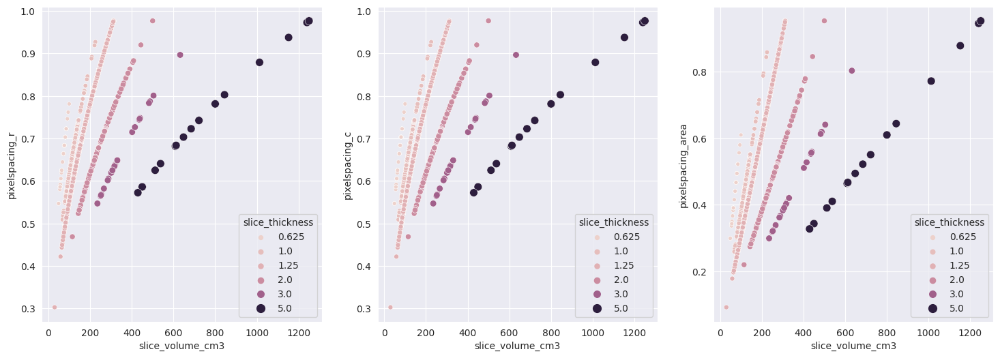

In [47]:
y_cols = ['pixelspacing_r','pixelspacing_c','pixelspacing_area']
x_cols = 'slice_volume_cm3'

plt.figure(figsize=(18,6))
for i in range(len(y_cols)):
    plt.subplot(1, 3, i+1)
    sns.scatterplot(x=x_cols,y=y_cols[i],data=scan_cols,hue='slice_thickness',size='slice_thickness')

📌 Slice_thickness is directly proportional to the volume

In [ ]:
sns.pairplot(final_df, hue = 'pe_present_on_image')

## Final DF 

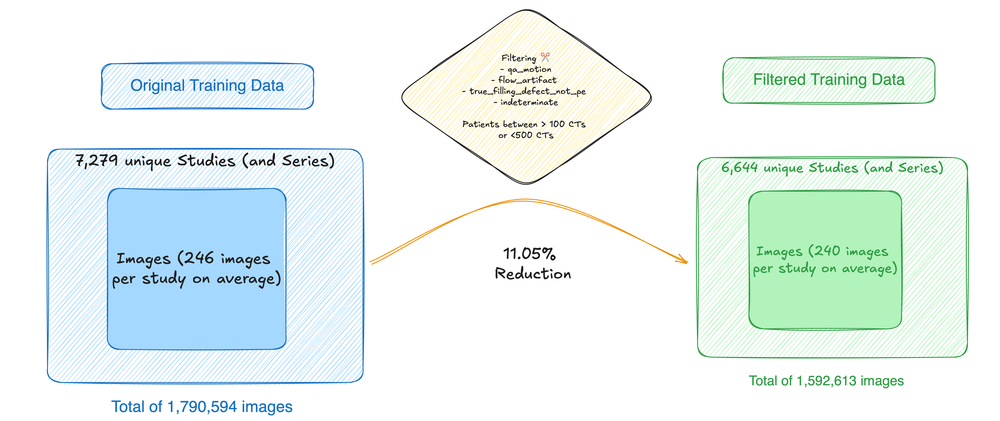

In [ ]:
x = final_df.drop(['StudyInstanceUID', 'SeriesInstanceUID', 'SOPInstanceUID'], axis=1).sum(axis=0).sort_values().reset_index()
x.columns = ['Labels', 'Records']

fig = px.bar(
    x, 
    x='Records', 
    y='Labels', 
    orientation='h', 
    title='Labels with Non-Zero Entries', 
    height=600, 
    width=800
)

for index, row in x.iterrows():
    fig.add_annotation(
        x=row['Records'],
        y=row['Labels'],
        text=str(row['Records']),
        showarrow=False,
        font=dict(size=12),
        xanchor='left',  
        xshift=5  
    )

fig.show()

In [ ]:
data = final_df.drop(['StudyInstanceUID', 'SeriesInstanceUID', 'SOPInstanceUID'], axis=1).astype(bool).sum(axis=1).reset_index()
data.columns = ['row', 'counts']
data = data.groupby(['counts'])['row'].count().reset_index()
fig = px.pie(
    data, 
    values=100 * data['row']/len(train_df), 
    names="counts", 
    title='Percentage Activations of Samples', 
    width=800, 
    height=500
)

fig.show()

In [87]:
len(final_df)

1592613

--- Train: 
Total Unique Studies&Series: 6,644
Min No. Images/Study: 102
Max No. Images/Study: 499
Avg No. Images/Study: 240


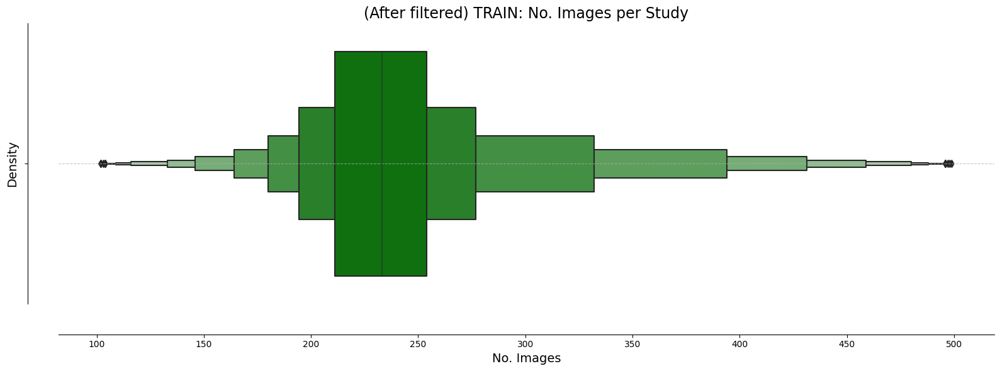

In [86]:

unique_studies = final_df['StudyInstanceUID'].nunique()
print(f"--- Train: \nTotal Unique Studies&Series: {unique_studies:,}")

study_group = final_df.groupby("StudyInstanceUID")["SOPInstanceUID"].count().reset_index()
min_images_per_study = study_group["SOPInstanceUID"].min()
max_images_per_study = study_group["SOPInstanceUID"].max()
avg_images_per_study = study_group["SOPInstanceUID"].mean()

print(f"Min No. Images/Study: {min_images_per_study:,}\n"
      f"Max No. Images/Study: {max_images_per_study:,}\n"
      f"Avg No. Images/Study: {avg_images_per_study:,.0f}")


plt.figure(figsize=(16, 6))
sns.boxenplot(x=study_group["SOPInstanceUID"], color = 'green')
sns.despine(right=True, offset=35)
plt.title("(After filtered) TRAIN: No. Images per Study", fontsize=17)
plt.xlabel('No. Images', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)  
plt.tight_layout()
plt.show()

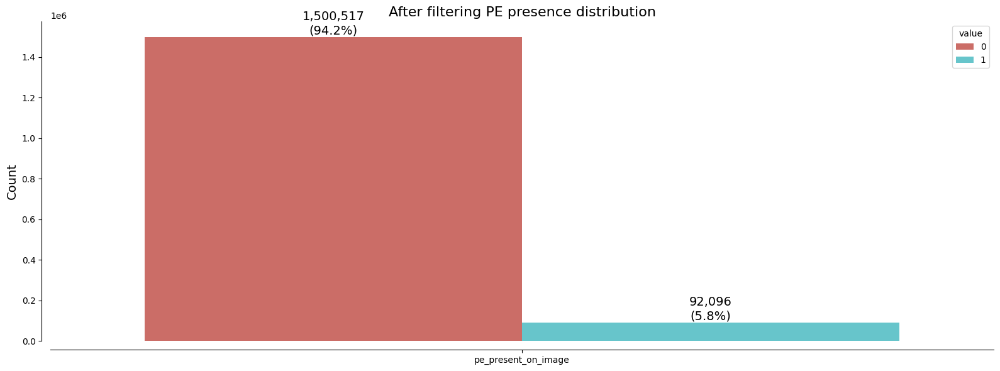

In [84]:
var = ['pe_present_on_image']
melt = final_df[['SOPInstanceUID'] + var]
melt = pd.melt(melt, id_vars=['SOPInstanceUID'], value_vars=var)

plt.figure(figsize=(16, 6))

a = sns.countplot(x=melt["variable"], hue=melt["value"], palette="hls")
sns.despine(right=True, offset=10)
plt.title("After filtering PE presence distribution", fontsize=16)
plt.xlabel("")
plt.ylabel("Count", fontsize=14)

total = len(melt)
for p in a.patches:
    count = int(p.get_height())
    percentage = count / total * 100
    a.annotate(f'{count:,}\n({percentage:.1f}%)', 
               (p.get_x() + p.get_width() / 2., p.get_height()), 
               ha='center', va='center', fontsize=14, color='black', 
               xytext=(0, 15), textcoords='offset points')  

plt.tight_layout()
plt.show()

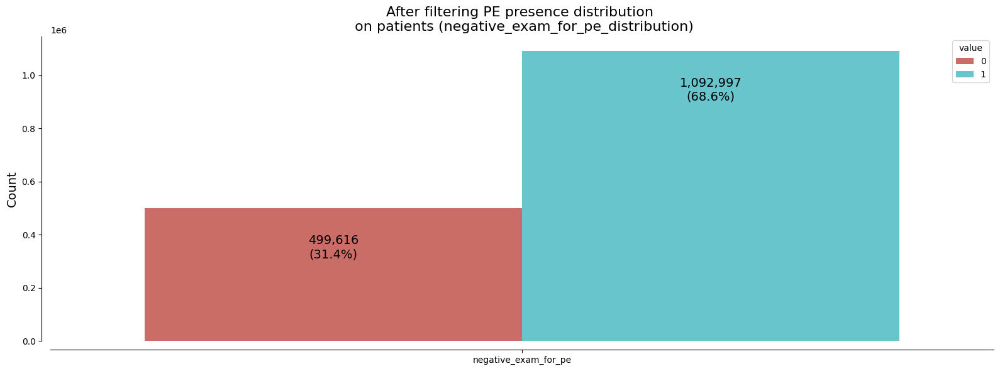

In [85]:
var = ['negative_exam_for_pe']
melt = final_df[['SOPInstanceUID'] + var]
melt = pd.melt(melt, id_vars=['SOPInstanceUID'], value_vars=var)

plt.figure(figsize=(16, 6))

a = sns.countplot(x=melt["variable"], hue=melt["value"], palette="hls")
sns.despine(right=True, offset=10)
plt.title("After filtering PE presence distribution \n on patients (negative_exam_for_pe_distribution)", fontsize=16)
plt.xlabel("")
plt.ylabel("Count", fontsize=14)

total = len(melt)
for p in a.patches:
    count = int(p.get_height())
    percentage = count / total * 100
    a.annotate(f'{count:,}\n({percentage:.1f}%)', 
               (p.get_x() + p.get_width() / 2., p.get_height()), 
               ha='center', va='center', fontsize=14, color='black', 
               xytext=(0, -45), textcoords='offset points')  

plt.tight_layout()
plt.show()


In [88]:
final_df.to_csv('final_df_Pulmonary_Embolism_CT_scans_data.csv',index=False)

In [91]:
train_cols = ['pe_present_on_image', 'negative_exam_for_pe', 'rv_lv_ratio_gte_1', 'rv_lv_ratio_lt_1',
       'leftsided_pe', 'chronic_pe',
       'rightsided_pe', 'acute_and_chronic_pe', 'central_pe']

<Axes: >

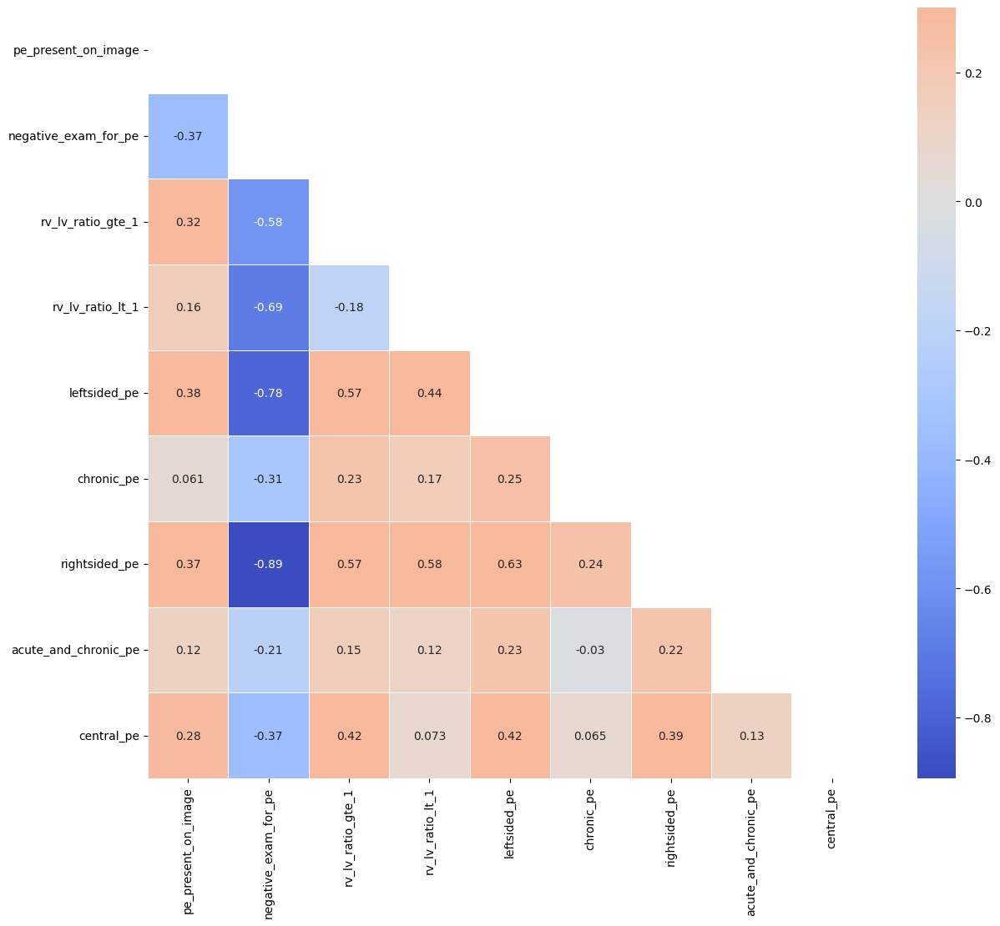

In [92]:
#Final DF
corr_mat = final_df[train_cols].corr()
mask = np.triu(np.ones_like(corr_mat, dtype=bool))
f, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(corr_mat, mask = mask, annot = True, vmax = 0.3, square = False, linewidths = 0.5, center = 0, cmap='coolwarm')

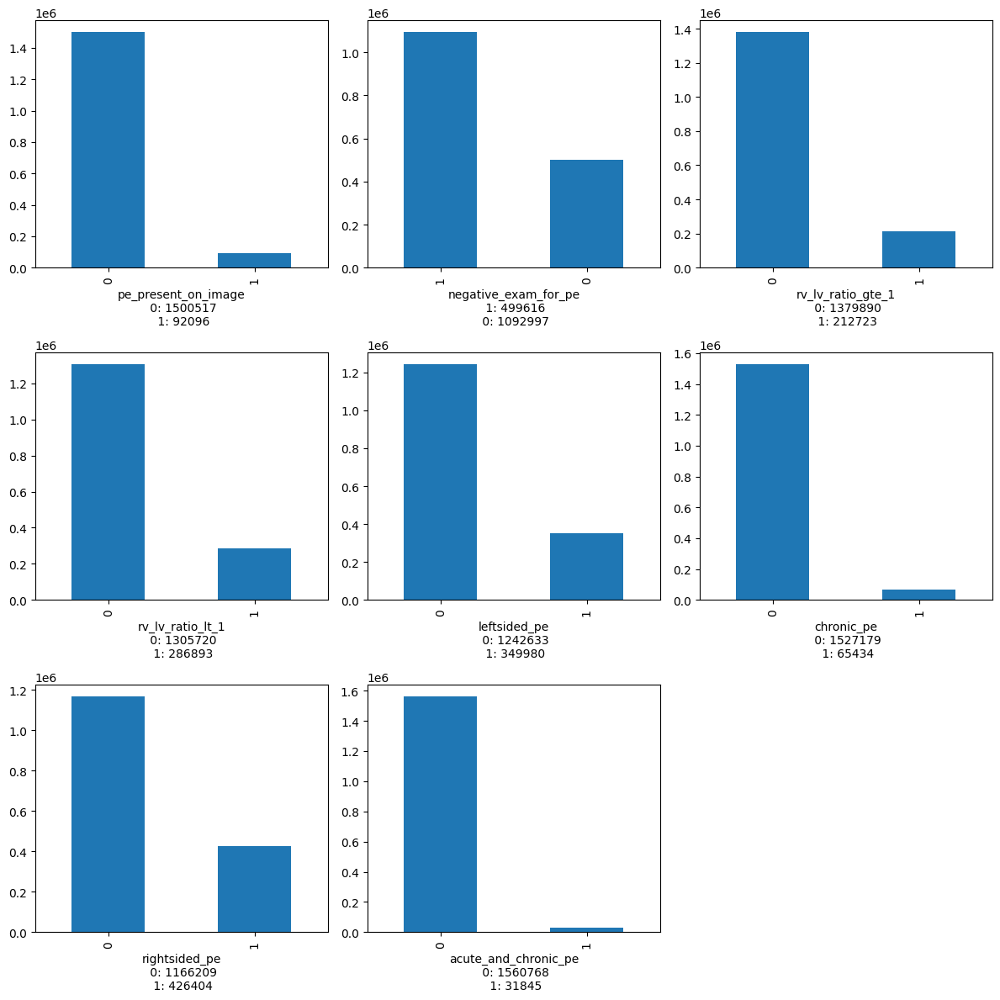

In [90]:


def plot_grid(cols = train_cols):
    fig=plt.figure(figsize=(12, 12))
    columns = 3
    rows = 3
    for i in range(1, columns*rows):
        col = cols[i-1]
        fig.add_subplot(rows, columns, i)
        final_df[col].value_counts().plot(kind = "bar")
        indices = final_df[col].value_counts().index.tolist()
        count_0 = final_df[col].value_counts()[0]
        count_1 = final_df[col].value_counts()[1]
        plt.xlabel(f"{col}\n {indices[0]}: {count_0}\n {indices[1]}: {count_1}")
    plt.tight_layout()
    plt.show()

plot_grid()